In [2]:
import math
import numpy as np
import pandas as pd
import cv2
import time

import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import display

In [3]:
class Node(object):
    def __init__(self,x,y,value):
        self.x = x
        self.y = y
        self.value = value

    def printInfo(self):
        print('%s:%s:%s' %(self.x,self.y,self.value))
        
def getMinChannel(img):

    # 输入检查
    if len(img.shape)==3 and img.shape[2]==3:
        pass
    else:
        print("bad image shape, input must be color image")
        return None
    
    return np.min(img, axis=2)
   
def getDarkChannel(img,blockSize = 3):

    # 输入检查
    if len(img.shape)==2:
        pass
    else:
        print("bad image shape, input image must be two demensions")
        return None

    # blockSize检查
    if blockSize % 2 == 0 or blockSize < 3:
        print('blockSize is not odd or too small')
        return None

    # 计算addSize
    A = int((blockSize-1)/2) #AddSize

    #New height and new width
    H = img.shape[0] + blockSize - 1
    W = img.shape[1] + blockSize - 1

    # 中间结果
    imgMiddle = 255 * np.ones((H,W))    

    imgMiddle[A:H-A, A:W-A] = img
    
    imgDark = np.zeros_like(img, np.uint8)    
    
    localMin = 255
    for i in range(A, H-A):
        for j in range(A, W-A):
            x = range(i-A, i+A+1)
            y = range(j-A, j+A+1)
            imgDark[i-A,j-A] = np.min(imgMiddle[x,y])                            
            
    return imgDark

def getAtomsphericLight(darkChannel,img,meanMode = False, percent = 0.001):

    size = darkChannel.shape[0]*darkChannel.shape[1]
    height = darkChannel.shape[0]
    width = darkChannel.shape[1]

    nodes = []

    # 用一个链表结构(list)存储数据
    for i in range(0,height):
        for j in range(0,width):
            oneNode = Node(i,j,darkChannel[i,j])
            nodes.append(oneNode)	

    # 排序
    nodes = sorted(nodes, key = lambda node: node.value,reverse = True)

    atomsphericLight = 0

    # 原图像像素过少时，只考虑第一个像素点
    if int(percent*size) == 0:
        for i in range(0,3):
            if img[nodes[0].x,nodes[0].y,i] > atomsphericLight:
                atomsphericLight = img[nodes[0].x,nodes[0].y,i]
        return atomsphericLight

    # 开启均值模式
    if meanMode:
        sum = 0
        for i in range(0,int(percent*size)):
            for j in range(0,3):
                sum = sum + img[nodes[i].x,nodes[i].y,j]
        atomsphericLight = int(sum/(int(percent*size)*3))
        return atomsphericLight

    # 获取暗通道前0.1%(percent)的位置的像素点在原图像中的最高亮度值
    for i in range(0,int(percent*size)):
        for j in range(0,3):
            if img[nodes[i].x,nodes[i].y,j] > atomsphericLight:
                atomsphericLight = img[nodes[i].x,nodes[i].y,j]
    return atomsphericLight

def getRecoverScene(img, omega=0.95, t0=0.1, blockSize=15, meanMode=False, percent=0.001, refine=True):

    imgGray = getMinChannel(img)
    imgDark = getDarkChannel(imgGray, blockSize = blockSize)
    atomsphericLight = getAtomsphericLight(imgDark,img,meanMode = meanMode,percent= percent)

    imgDark = np.float64(imgDark)
    transmission = 1 - omega * imgDark / atomsphericLight

    # 防止出现t小于0的情况
    # 对t限制最小值为0.1
    transmission[transmission<0.1] = 0.1     
    
    if refine:        
        normI = (img - img.min()) / (img.max() - img.min())  # normalize I
        transmission = guided_filter(normI, transmission, r=40, eps=1e-3)

    sceneRadiance = np.zeros(img.shape)
    img = np.float64(img)
    
    for i in range(3):        
        SR = (img[:,:,i] - atomsphericLight)/transmission + atomsphericLight

        # 限制透射率 在0～255                  
        SR[SR>255] = 255
        SR[SR<0] = 0                    
        sceneRadiance[:,:,i] = SR  
            
    sceneRadiance = np.uint8(sceneRadiance)

    return sceneRadiance

In [4]:
"""Implementation for Guided Image Filtering
Reference:
http://research.microsoft.com/en-us/um/people/kahe/eccv10/
"""

from itertools import combinations_with_replacement
from collections import defaultdict

import numpy as np
from numpy.linalg import inv

R, G, B = 0, 1, 2  # index for convenience


def boxfilter(I, r):
    """Fast box filter implementation.
    Parameters
    ----------
    I:  a single channel/gray image data normalized to [0.0, 1.0]
    r:  window radius
    Return
    -----------
    The filtered image data.
    """        
    M, N = I.shape
    dest = np.zeros((M, N))

    # cumulative sum over Y axis
    sumY = np.cumsum(I, axis=0)
    # difference over Y axis
    dest[:r + 1] = sumY[r: 2 * r + 1]
    dest[r + 1:M - r] = sumY[2 * r + 1:] - sumY[:M - 2 * r - 1]
    dest[-r:] = np.tile(sumY[-1], (r, 1)) - sumY[M - 2 * r - 1:M - r - 1]

    # cumulative sum over X axis
    sumX = np.cumsum(dest, axis=1)
    # difference over Y axis
    dest[:, :r + 1] = sumX[:, r:2 * r + 1]
    dest[:, r + 1:N - r] = sumX[:, 2 * r + 1:] - sumX[:, :N - 2 * r - 1]
    dest[:, -r:] = np.tile(sumX[:, -1][:, None], (1, r)) - \
        sumX[:, N - 2 * r - 1:N - r - 1]

    return dest


def guided_filter(I, p, r=40, eps=1e-3):
    """Refine a filter under the guidance of another (RGB) image.
    Parameters
    -----------
    I:   an M * N * 3 RGB image for guidance.
    p:   the M * N filter to be guided
    r:   the radius of the guidance
    eps: epsilon for the guided filter
    Return
    -----------
    The guided filter.
    """    
    M, N = p.shape
    base = boxfilter(np.ones((M, N)), r)

    # each channel of I filtered with the mean filter
    means = [boxfilter(I[:, :, i], r) / base for i in range(3)]
    # p filtered with the mean filter
    mean_p = boxfilter(p, r) / base
    # filter I with p then filter it with the mean filter
    means_IP = [boxfilter(I[:, :, i] * p, r) / base for i in range(3)]
    # covariance of (I, p) in each local patch
    covIP = [means_IP[i] - means[i] * mean_p for i in range(3)]

    # variance of I in each local patch: the matrix Sigma in ECCV10 eq.14
    var = defaultdict(dict)
    for i, j in combinations_with_replacement(range(3), 2):
        var[i][j] = boxfilter(
            I[:, :, i] * I[:, :, j], r) / base - means[i] * means[j]

    a = np.zeros((M, N, 3))
    for y, x in np.ndindex(M, N):
        #         rr, rg, rb
        # Sigma = rg, gg, gb
        #         rb, gb, bb
        Sigma = np.array([[var[R][R][y, x], var[R][G][y, x], var[R][B][y, x]],
                          [var[R][G][y, x], var[G][G][y, x], var[G][B][y, x]],
                          [var[R][B][y, x], var[G][B][y, x], var[B][B][y, x]]])
        cov = np.array([c[y, x] for c in covIP])
        a[y, x] = np.dot(cov, inv(Sigma + eps * np.eye(3)))  # eq 14

    # ECCV10 eq.15
    b = mean_p - a[:, :, R] * means[R] - \
        a[:, :, G] * means[G] - a[:, :, B] * means[B]

    # ECCV10 eq.16
    q = (boxfilter(a[:, :, R], r) * I[:, :, R] + boxfilter(a[:, :, G], r) *
         I[:, :, G] + boxfilter(a[:, :, B], r) * I[:, :, B] + boxfilter(b, r)) / base

    return q

df_train = pd.read_csv('../input/train_v2.csv')

Let's look at the results on some hazy images.

For each hazy image, from left to right we will plot the original image, then dark channel prior with refinement, then without. For the satellite images, refinement does not seem to have much impact, but it definitely helps to reduce artefacts in general.

Hazy_img_idx = [104, 3007, 3794, 23710, 38469]

for i in Hazy_img_idx:    
     
    path = '../input/train-jpg/'
    filename = 'train_{}.jpg'.format(i)
    img = cv2.imread(path+filename)  #0-255    
    
    dehazed_img1 = getRecoverScene(img, refine=True)
    dehazed_img2 = getRecoverScene(img, refine=False)

    fig = plt.figure()
    fig.set_size_inches(12, 4)
    fig.suptitle(filename + '   Tags: ' + df_train['tags'][i], fontsize=12)

    plt.subplot(131)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    plt.subplot(132)
    plt.imshow(cv2.cvtColor(dehazed_img1, cv2.COLOR_BGR2RGB))
    
    plt.subplot(133)
    plt.imshow(cv2.cvtColor(dehazed_img2, cv2.COLOR_BGR2RGB))
    
    plt.show()



SyntaxError: unterminated string literal (detected at line 99) (1420868480.py, line 99)

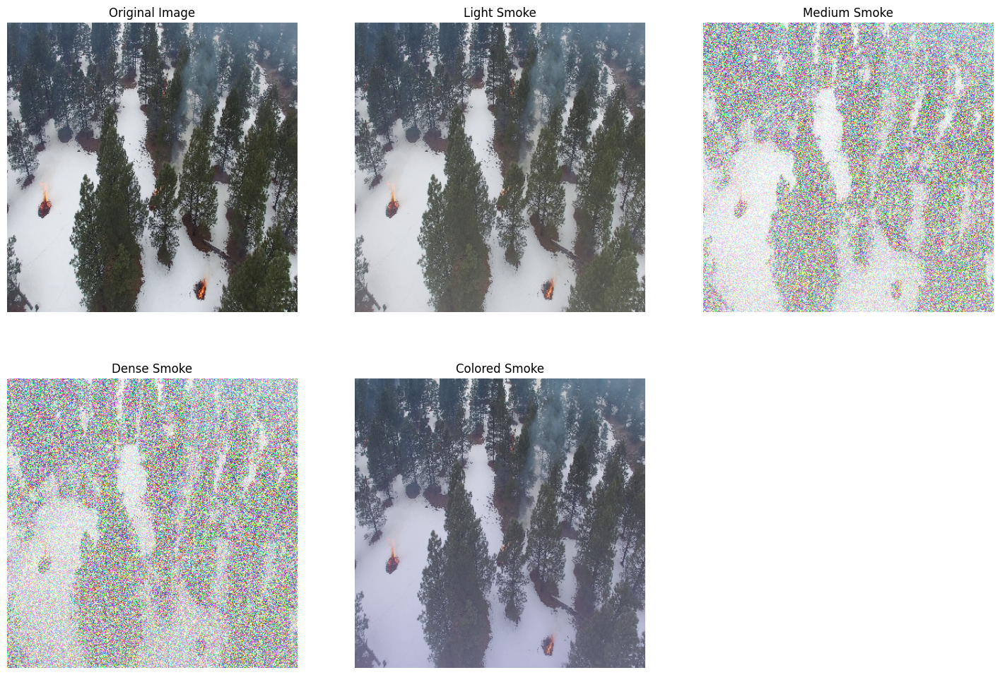

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
        
        # Apply noise if required
        if apply_noise:
            noise = np.random.normal(0, 25, (width, 3)).astype(np.uint8)
            smoke_image[y] = cv2.add(smoke_image[y], noise)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 20) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

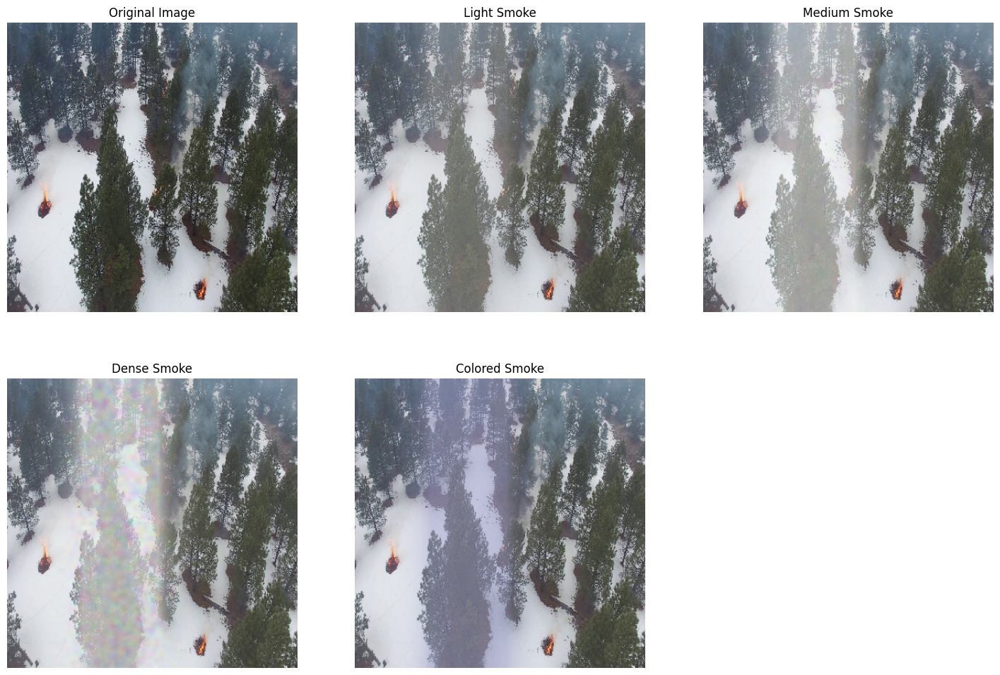

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 20) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel.reshape(3)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 20) * smoke_intensity
    else:
        smoke_intensity_map = np.zeros((height, width), dtype=np.float32)

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Create fog layer
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog separately
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel

    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'  # Change this to your image path
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 20) * smoke_intensity
    else:
        smoke_intensity_map = np.zeros((height, width), dtype=np.float32)

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Create fog layer
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog separately
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel

    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = 'path_to_your_image.jpg'  # Change this to your image path
image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(f"Image file not found at {image_path}")

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, :]
        fog_alpha = fog_intensity_map[y, :]
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        for x in range(width):
            smoke_alpha = float(alpha[x])
            fog_alpha_value = float(fog_alpha[x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[x], smoke_alpha, 0)
            
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha_value, fog_layer[y, x], fog_alpha_value, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, :]
        fog_alpha = fog_intensity_map[y, :]
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        for x in range(width):
            smoke_alpha = float(alpha[x])
            fog_alpha_value = float(fog_alpha[x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[x], smoke_alpha, 0)
            
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha_value, fog_layer[y, x], fog_alpha_value, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, :]
        fog_alpha = fog_intensity_map[y, :]
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        for x in range(width):
            smoke_alpha = float(alpha[x])
            fog_alpha_value = float(fog_alpha[x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[x, :], smoke_alpha, 0)
            
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha_value, fog_layer[y, x], fog_alpha_value, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, :]
        fog_alpha = fog_intensity_map[y, :]
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        for x in range(width):
            smoke_alpha = float(alpha[x])
            fog_alpha_value = float(fog_alpha[x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[x, :], smoke_alpha, 0)
            
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha_value, fog_layer[y, x], fog_alpha_value, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, :]
        fog_alpha = fog_intensity_map[y, :]
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y, :, :])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        for x in range(width):
            smoke_alpha = float(alpha[x])
            fog_alpha_value = float(fog_alpha[x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[x], smoke_alpha, 0)
            
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha_value, fog_layer[y, x], fog_alpha_value, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full_like(image, smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_image[y, x] = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            smoke_image[y, x] = cv2.addWeighted(smoke_image[y, x], 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import distance_transform_edt

def add_smoke(image, smoke_type='light', fire_mask=None, fog_intensity=0.1):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    
    # Create a dynamic smoke intensity map based on distance from fire
    if fire_mask is not None:
        fire_distance = distance_transform_edt(255 - fire_mask[:, :, 0])
        smoke_intensity_map = np.exp(-fire_distance / 50) * smoke_intensity
    else:
        smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
        smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)
    
    # Apply fog
    fog_layer = np.full_like(image, 255, dtype=np.uint8)
    fog_intensity_map = np.full((height, width), fog_intensity, dtype=np.float32)
    
    # Create smoke layer
    smoke_layer = np.full((height, width, 3), smoke_color, dtype=np.uint8)
    smoke_layer = cv2.add(smoke_layer, noise)
    smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
    
    # Blend smoke and fog
    for y in range(height):
        for x in range(width):
            smoke_alpha = float(smoke_intensity_map[y, x])
            fog_alpha = float(fog_intensity_map[y, x])
            
            # Blend smoke
            smoke_pixel = cv2.addWeighted(image[y, x], 1 - smoke_alpha, smoke_layer[y, x], smoke_alpha, 0)
            # Blend fog
            final_pixel = cv2.addWeighted(smoke_pixel, 1 - fog_alpha, fog_layer[y, x], fog_alpha, 0)
            
            smoke_image[y, x] = final_pixel
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros((384, 384, 3), dtype=np.uint8)
fire_mask[:, 100:200, :] = 255

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: could not broadcast input array from shape (3,1) into shape (3,)

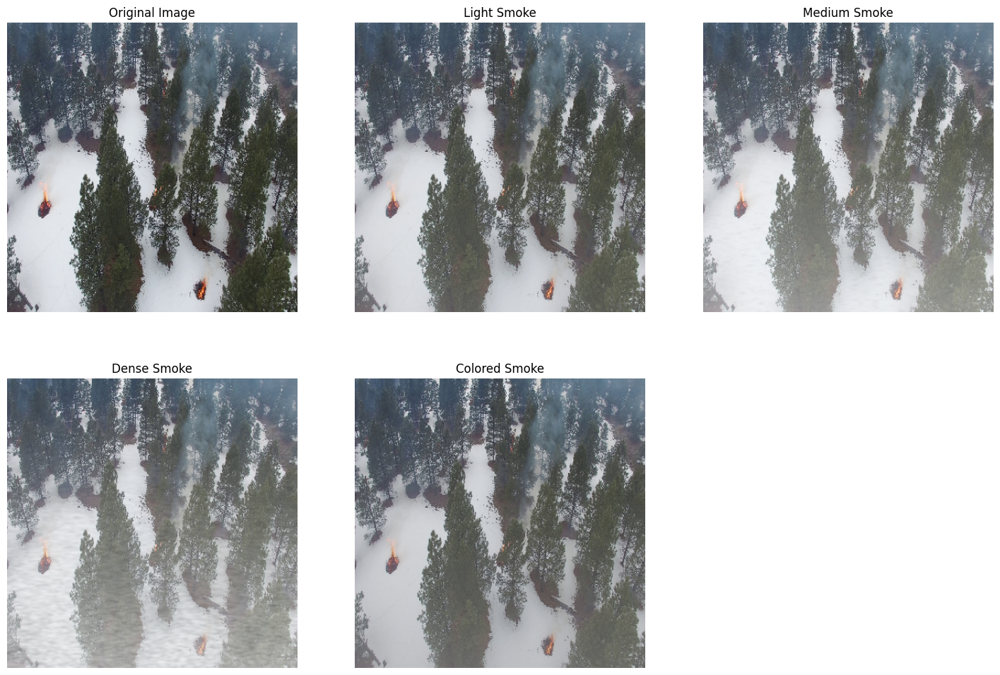

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)

    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


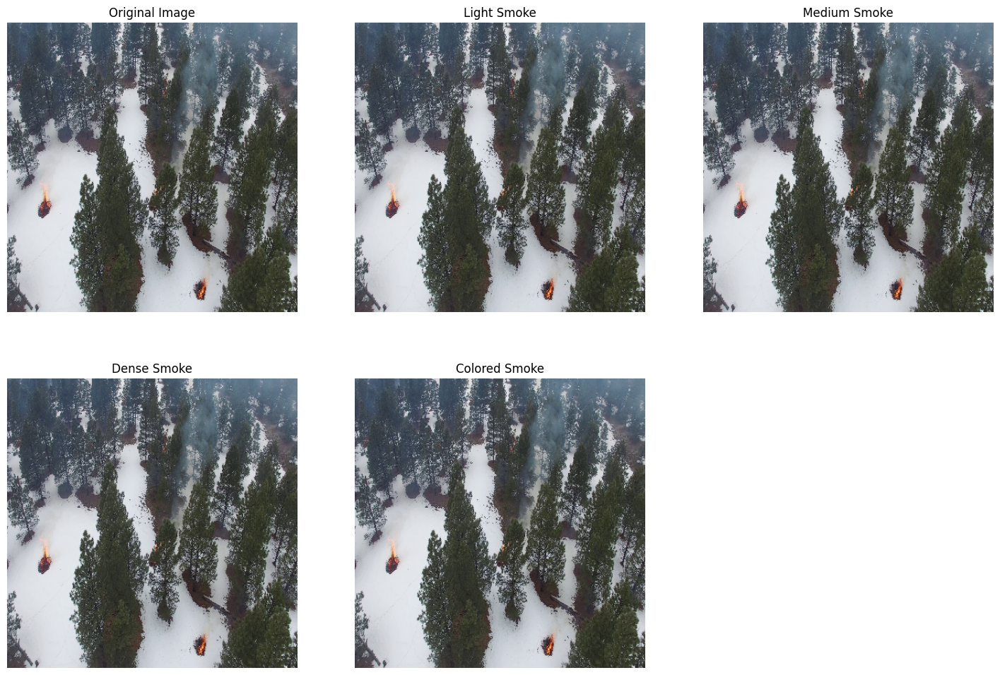

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_smoke(image, smoke_type='light', fire_mask=None):
    smoke_image = np.copy(image)
    
    # Define different smoke colors and intensities
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise': False},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise': True},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise': True},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise': False}  # Example of colored smoke
    }
    
    # Get the selected smoke type properties
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    apply_noise = smoke_properties['noise']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    # Apply noise if required
    if apply_noise:
        noise = np.random.normal(0, 25, (height, width, 3)).astype(np.uint8)
        noise = cv2.GaussianBlur(noise, (5, 5), 0)
    else:
        noise = np.zeros((height, width, 3), dtype=np.uint8)

    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        
        if fire_mask is not None:
            alpha *= fire_mask[y, :, 0] / 255.0  # Ensure alpha is a scalar float
        
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        
        # Convert alpha to float for cv2.addWeighted
        alpha = float(alpha[0])  # Assuming alpha is a single-element array
        
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

# Example usage with fire detection (not implemented here, just for illustration)
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Simulate fire mask (not implemented here, should be based on fire detection)
fire_mask = np.zeros_like(resized_image)
# Assuming fire mask has intensity values where fire is detected
# This is a placeholder for actual fire detection algorithm result
fire_mask[:, 100:200, :] = 255  

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light', fire_mask=fire_mask)
smoke_medium = add_smoke(resized_image, smoke_type='medium', fire_mask=fire_mask)
smoke_dense = add_smoke(resized_image, smoke_type='dense', fire_mask=fire_mask)
smoke_colored = add_smoke(resized_image, smoke_type='colored', fire_mask=fire_mask)

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_perlin_noise_2d(shape, res):
    def fade(t):
        return 6 * t**5 - 15 * t**4 + 10 * t**3

    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0], 0:res[1]].transpose(1, 2, 0) % 1
    gradients = np.random.rand(res[0] + 1, res[1] + 1, 2) * 2 - 1
    gradients /= np.linalg.norm(gradients, axis=2, keepdims=True)
    g00 = gradients[:-1, :-1]
    g10 = gradients[1:, :-1]
    g01 = gradients[:-1, 1:]
    g11 = gradients[1:, 1:]
    n00 = np.sum(np.dstack((grid[..., 0], grid[..., 1])) * g00, axis=2)
    n10 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1])) * g10, axis=2)
    n01 = np.sum(np.dstack((grid[..., 0], grid[..., 1] - 1)) * g01, axis=2)
    n11 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1] - 1)) * g11, axis=2)
    t = fade(grid)
    n0 = n00 * (1 - t[..., 0]) + t[..., 0] * n10
    n1 = n01 * (1 - t[..., 0]) + t[..., 0] * n11
    return np.sqrt(2) * ((1 - t[..., 1]) * n0 + t[..., 1] * n1)

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise_res': (4, 4)},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise_res': (16, 16)},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)} 
    }
    
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    noise_res = smoke_properties['noise_res']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    noise = generate_perlin_noise_2d((height, width), noise_res)
    if noise.max() != noise.min():
        noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
    else:
        noise = np.zeros_like(noise)
    noise = (noise * 255).astype(np.uint8)
    noise = cv2.cvtColor(noise, cv2.COLOR_GRAY2BGR)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y:y+1, :, :])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer[0], alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


error: OpenCV(4.9.0) /io/opencv/modules/core/src/arithm.cpp:647: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_perlin_noise_2d(shape, res):
    def fade(t):
        return 6 * t**5 - 15 * t**4 + 10 * t**3

    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0], 0:res[1]].transpose(1, 2, 0) % 1
    gradients = np.random.rand(res[0] + 1, res[1] + 1, 2) * 2 - 1
    gradients /= np.linalg.norm(gradients, axis=2, keepdims=True)
    g00 = gradients[:-1, :-1]
    g10 = gradients[1:, :-1]
    g01 = gradients[:-1, 1:]
    g11 = gradients[1:, 1:]
    n00 = np.sum(np.dstack((grid[..., 0], grid[..., 1])) * g00, axis=2)
    n10 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1])) * g10, axis=2)
    n01 = np.sum(np.dstack((grid[..., 0], grid[..., 1] - 1)) * g01, axis=2)
    n11 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1] - 1)) * g11, axis=2)
    t = fade(grid)
    n0 = n00 * (1 - t[..., 0]) + t[..., 0] * n10
    n1 = n01 * (1 - t[..., 0]) + t[..., 0] * n11
    return np.sqrt(2) * ((1 - t[..., 1]) * n0 + t[..., 1] * n1)

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise_res': (4, 4)},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise_res': (16, 16)},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)} 
    }
    
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    noise_res = smoke_properties['noise_res']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    noise = generate_perlin_noise_2d((height, width), noise_res)
    if noise.max() != noise.min():
        noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
    else:
        noise = np.zeros_like(noise)
    noise = (noise * 255).astype(np.uint8)
    noise = cv2.cvtColor(noise, cv2.COLOR_GRAY2BGR)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        noise_layer = noise[y].reshape(1, width, 3)  # Reshape noise to match smoke_layer
        smoke_layer = cv2.add(smoke_layer, noise_layer)
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer[0], alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ValueError: cannot reshape array of size 12 into shape (1,384,3)

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from noise import pnoise2

def generate_perlin_noise_2d(shape, res):
    def f(t):
        return 6*t**5 - 15*t**4 + 10*t**3
    
    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0], 0:res[1]].transpose(1, 2, 0) % 1
    gradients = np.random.rand(res[0] + 1, res[1] + 1, 2) * 2 - 1
    gradients /= np.linalg.norm(gradients, axis=2, keepdims=True)
    g00 = gradients[:-1, :-1]
    g10 = gradients[1:, :-1]
    g01 = gradients[:-1, 1:]
    g11 = gradients[1:, 1:]
    n00 = np.sum(grid * g00, axis=2)
    n10 = np.sum(np.stack([grid[:, :, 0] - 1, grid[:, :, 1]], axis=2) * g10, axis=2)
    n01 = np.sum(np.stack([grid[:, :, 0], grid[:, :, 1] - 1], axis=2) * g01, axis=2)
    n11 = np.sum(np.stack([grid[:, :, 0] - 1, grid[:, :, 1] - 1], axis=2) * g11, axis=2)
    t = f(grid)
    n0 = n00 * (1 - t[:, :, 0]) + t[:, :, 0] * n10
    n1 = n01 * (1 - t[:, :, 0]) + t[:, :, 0] * n11
    return np.sqrt(2) * ((1 - t[:, :, 1]) * n0 + t[:, :, 1] * n1)

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise_res': (4, 4)},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise_res': (16, 16)},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)} 
    }
    
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    noise_res = smoke_properties['noise_res']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    noise = generate_perlin_noise_2d((height, width), noise_res)
    noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
    noise = (noise * 255).astype(np.uint8)
    noise = cv2.cvtColor(noise, cv2.COLOR_GRAY2BGR)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


ModuleNotFoundError: No module named 'noise'

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_perlin_noise_2d(shape, res):
    def fade(t):
        return 6 * t**5 - 15 * t**4 + 10 * t**3

    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0], 0:res[1]].transpose(1, 2, 0) % 1
    gradients = np.random.rand(res[0] + 1, res[1] + 1, 2) * 2 - 1
    gradients /= np.linalg.norm(gradients, axis=2, keepdims=True)
    g00 = gradients[:-1, :-1]
    g10 = gradients[1:, :-1]
    g01 = gradients[:-1, 1:]
    g11 = gradients[1:, 1:]
    n00 = np.sum(np.dstack((grid[..., 0], grid[..., 1])) * g00, axis=2)
    n10 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1])) * g10, axis=2)
    n01 = np.sum(np.dstack((grid[..., 0], grid[..., 1] - 1)) * g01, axis=2)
    n11 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1] - 1)) * g11, axis=2)
    t = fade(grid)
    n0 = n00 * (1 - t[..., 0]) + t[..., 0] * n10
    n1 = n01 * (1 - t[..., 0]) + t[..., 0] * n11
    return np.sqrt(2) * ((1 - t[..., 1]) * n0 + t[..., 1] * n1)

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise_res': (4, 4)},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise_res': (16, 16)},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)} 
    }
    
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    noise_res = smoke_properties['noise_res']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    noise = generate_perlin_noise_2d((height, width), noise_res)
    noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
    noise = (noise * 255).astype(np.uint8)
    noise = cv2.cvtColor(noise, cv2.COLOR_GRAY2BGR)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


/tmp/ipykernel_34/375566651.py:47: RuntimeWarning: invalid value encountered in divide
  noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
/tmp/ipykernel_34/375566651.py:48: RuntimeWarning: invalid value encountered in cast
  noise = (noise * 255).astype(np.uint8)


error: OpenCV(4.9.0) /io/opencv/modules/core/src/arithm.cpp:647: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def generate_perlin_noise_2d(shape, res):
    def fade(t):
        return 6 * t**5 - 15 * t**4 + 10 * t**3

    delta = (res[0] / shape[0], res[1] / shape[1])
    d = (shape[0] // res[0], shape[1] // res[1])
    grid = np.mgrid[0:res[0], 0:res[1]].transpose(1, 2, 0) % 1
    gradients = np.random.rand(res[0] + 1, res[1] + 1, 2) * 2 - 1
    gradients /= np.linalg.norm(gradients, axis=2, keepdims=True)
    g00 = gradients[:-1, :-1]
    g10 = gradients[1:, :-1]
    g01 = gradients[:-1, 1:]
    g11 = gradients[1:, 1:]
    n00 = np.sum(np.dstack((grid[..., 0], grid[..., 1])) * g00, axis=2)
    n10 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1])) * g10, axis=2)
    n01 = np.sum(np.dstack((grid[..., 0], grid[..., 1] - 1)) * g01, axis=2)
    n11 = np.sum(np.dstack((grid[..., 0] - 1, grid[..., 1] - 1)) * g11, axis=2)
    t = fade(grid)
    n0 = n00 * (1 - t[..., 0]) + t[..., 0] * n10
    n1 = n01 * (1 - t[..., 0]) + t[..., 0] * n11
    return np.sqrt(2) * ((1 - t[..., 1]) * n0 + t[..., 1] * n1)

def add_smoke(image, smoke_type='light'):
    smoke_image = np.copy(image)
    
    smoke_types = {
        'light': {'color': (200, 200, 200), 'intensity': 0.3, 'noise_res': (4, 4)},
        'medium': {'color': (150, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)},
        'dense': {'color': (100, 100, 100), 'intensity': 0.7, 'noise_res': (16, 16)},
        'colored': {'color': (200, 150, 150), 'intensity': 0.5, 'noise_res': (8, 8)} 
    }
    
    smoke_properties = smoke_types.get(smoke_type, smoke_types['light'])
    smoke_color = smoke_properties['color']
    smoke_intensity = smoke_properties['intensity']
    noise_res = smoke_properties['noise_res']
    
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height).reshape(height, 1)
    smoke_intensity_map = np.tile(smoke_intensity_map, (1, width))

    noise = generate_perlin_noise_2d((height, width), noise_res)
    if noise.max() != noise.min():
        noise = (noise - noise.min()) / (noise.max() - noise.min())  # Normalize to 0-1
    else:
        noise = np.zeros_like(noise)
    noise = (noise * 255).astype(np.uint8)
    noise = cv2.cvtColor(noise, cv2.COLOR_GRAY2BGR)
    
    for y in range(height):
        alpha = smoke_intensity_map[y, 0]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_layer = cv2.add(smoke_layer, noise[y:y+1, :, :])
        smoke_layer = cv2.GaussianBlur(smoke_layer, (15, 15), 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer[0], alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))

# Add different kinds of smoke to the image
smoke_light = add_smoke(resized_image, smoke_type='light')
smoke_medium = add_smoke(resized_image, smoke_type='medium')
smoke_dense = add_smoke(resized_image, smoke_type='dense')
smoke_colored = add_smoke(resized_image, smoke_type='colored')

# Display the original image and images with different smoke types
plt.figure(figsize=(18, 12))
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(smoke_light, cv2.COLOR_BGR2RGB))
plt.title('Light Smoke')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(smoke_medium, cv2.COLOR_BGR2RGB))
plt.title('Medium Smoke')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(smoke_dense, cv2.COLOR_BGR2RGB))
plt.title('Dense Smoke')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_colored, cv2.COLOR_BGR2RGB))
plt.title('Colored Smoke')
plt.axis('off')

plt.show()


error: OpenCV(4.9.0) /io/opencv/modules/core/src/arithm.cpp:647: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


In [5]:
import cv2
import numpy as np

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1010.jpg'
image = cv2.imread(im_path)
if image is None:
    print(f'Error: Image not found at {im_path}')
    exit()

# Process the image
dark = dark_channel(image, 15)
atmospheric_light = estimate_atmospheric_light(image, dark)
transmission = estimate_transmission(atmospheric_light, image, 15)
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# # Display the results
# cv2.imshow('Original Image', image)
# cv2.imshow('Recovered Image', scene_radiance)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


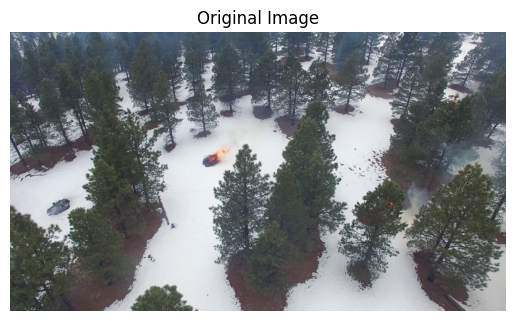

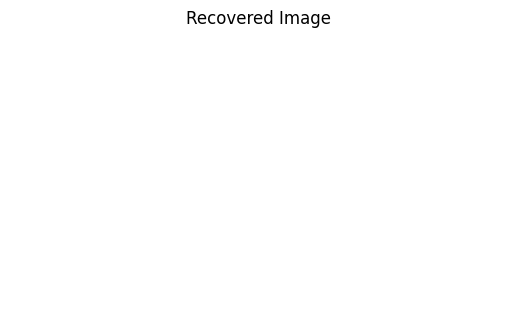

In [6]:
import matplotlib.pyplot as plt

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

# Display the recovered image
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()


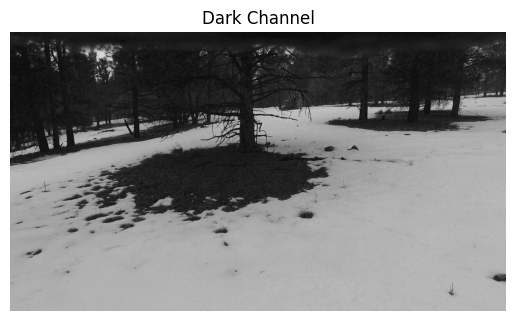

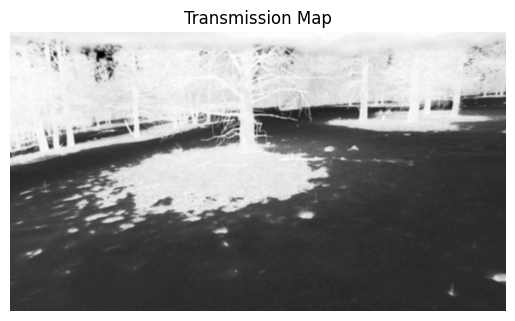

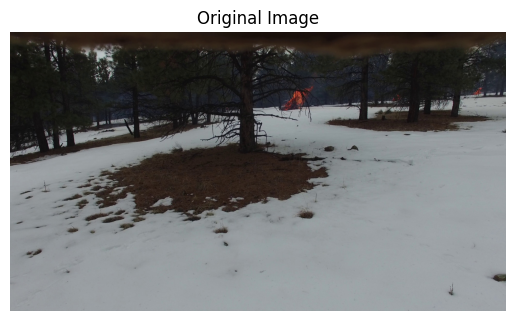

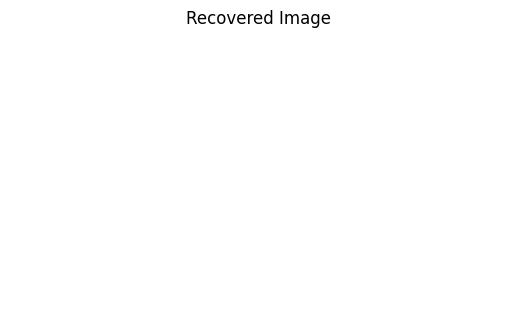

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_102.jpg'
image = cv2.imread(im_path)
if image is None:
    print(f'Error: Image not found at {im_path}')
    exit()

# Process the image
dark = dark_channel(image, 15)

# Debug: Visualize dark channel
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')
plt.show()

atmospheric_light = estimate_atmospheric_light(image, dark)
transmission = estimate_transmission(atmospheric_light, image, 15)

# Debug: Visualize transmission map
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.axis('off')
plt.show()

scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

# Display the recovered image
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()


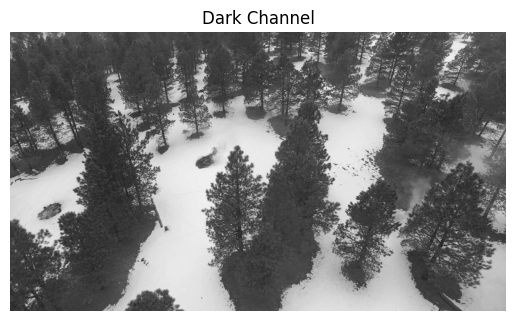

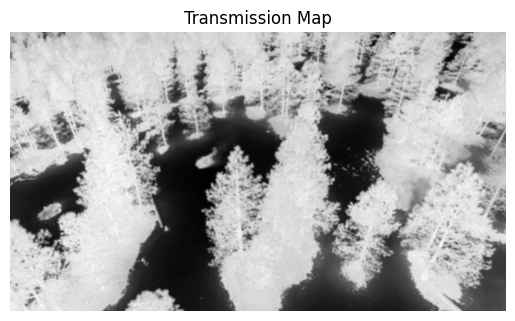

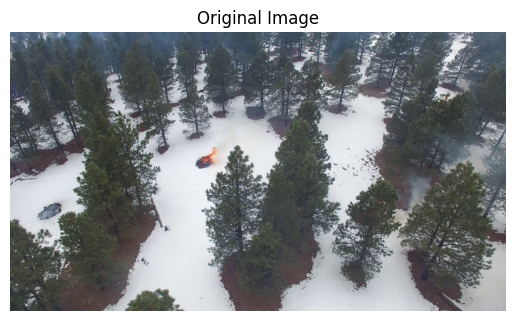

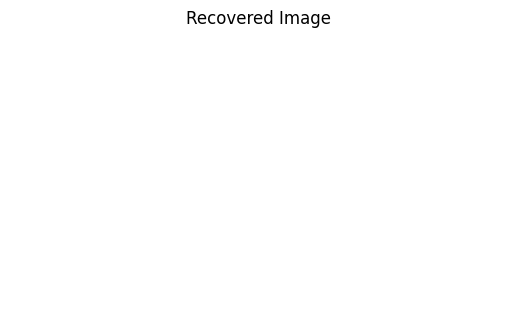

In [8]:
# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1022.jpg'
image = cv2.imread(im_path)
if image is None:
    print(f'Error: Image not found at {im_path}')
    exit()

# Process the image
dark = dark_channel(image, 15)

# Debug: Visualize dark channel
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')
plt.show()

atmospheric_light = estimate_atmospheric_light(image, dark)
transmission = estimate_transmission(atmospheric_light, image, 15)

# Debug: Visualize transmission map
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.axis('off')
plt.show()

# Experiment with different parameters if necessary
# For example, you can adjust the omega parameter in estimate_transmission function

# Recover the scene radiance
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

# Display the recovered image
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()


In [9]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1010.jpg'
image = cv2.imread(image_path)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(384),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Display the depth map
cv2.imshow('Depth Map', depth_map)
cv2.waitKey(0)
cv2.destroyAllWindows()


/opt/conda/lib/python3.10/site-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip


Loading weights:  None


Downloading: "https://github.com/facebookresearch/WSL-Images/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to /root/.cache/torch/hub/checkpoints/ig_resnext101_32x8-c38310e5.pth
100%|██████████| 340M/340M [00:01<00:00, 245MB/s]  
Downloading: "https://github.com/isl-org/MiDaS/releases/download/v2_1/midas_v21_384.pt" to /root/.cache/torch/hub/checkpoints/midas_v21_384.pt
100%|██████████| 403M/403M [00:01<00:00, 323MB/s]  


RuntimeError: The size of tensor a (44) must match the size of tensor b (43) at non-singleton dimension 3

In [ ]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1010.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Display the depth map
cv2.imshow('Depth Map', depth_map)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1010.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Save the depth map as an image file
cv2.imwrite('/kaggle/working/depth_map.jpg', depth_map)

# Display the depth map using matplotlib
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')
plt.show()


In [ ]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Save the depth map as an image file
cv2.imwrite('/kaggle/working/depth_map.jpg', depth_map)

# Display the depth map using matplotlib
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')
plt.show()


In [ ]:
def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

# Estimate atmospheric light using the brightest pixel in the image
def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

# Load the original image
original_image = cv2.imread(image_path)

# Perform haze removal using depth map and atmospheric light
haze_removed_image = haze_removal(original_image, depth_map, atmospheric_light)

# Display the original image, depth map, and haze removed image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image')
plt.axis('off')

plt.show()


In [ ]:
import cv2
import numpy as np

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image


In [ ]:
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Display the original image, depth map, and haze removed image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.show()

In [ ]:
# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_688.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Display the original image, depth map, and haze removed image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.show()

In [ ]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Display the original image, depth map, hazy image, haze removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


In [10]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_688.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Display the original image, depth map, hazy image, haze removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


Loading weights:  None


NameError: name 'haze_removal' is not defined

In [11]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Add haze to the original image
hazy_image = add_haze(image, haze_intensity=0.5)

# Display the original image, depth map, hazy image, haze-removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(hazy_image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


NameError: name 'haze_removal' is not defined

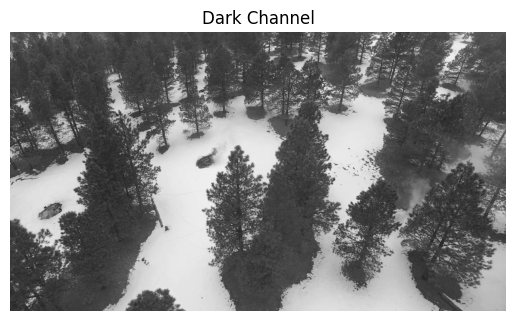

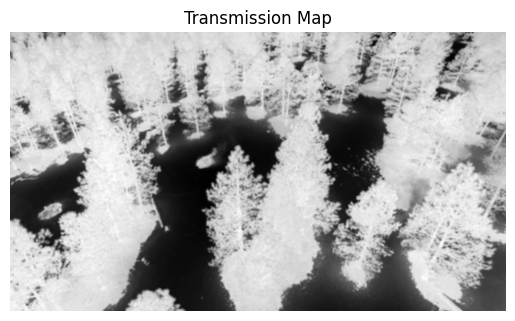

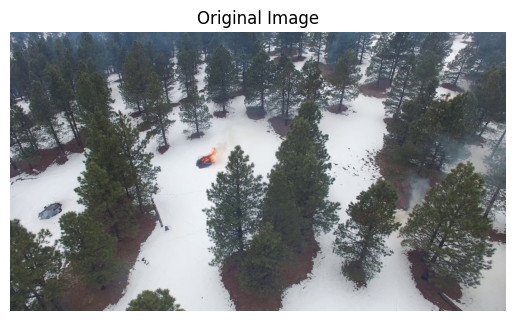

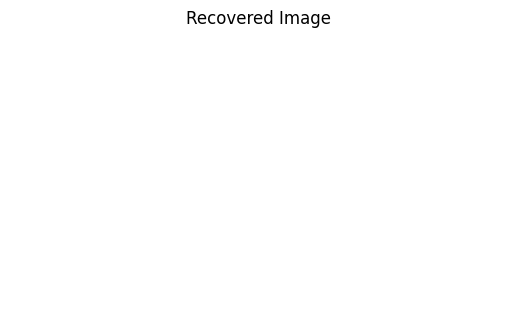

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(im_path)
if image is None:
    print(f'Error: Image not found at {im_path}')
    exit()

# Process the image
dark = dark_channel(image, 15)

# Debug: Visualize dark channel
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')
plt.show()

atmospheric_light = estimate_atmospheric_light(image, dark)
transmission = estimate_transmission(atmospheric_light, image, 15)

# Debug: Visualize transmission map
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.axis('off')
plt.show()

scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

# Display the recovered image
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()


In [13]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Add haze to the original image
hazy_image = add_haze(image, haze_intensity=0.5)

# Display the original image, depth map, hazy image, haze-removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(hazy_image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


NameError: name 'haze_removal' is not defined

In [ ]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1931.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Add haze to the original image
hazy_image = add_haze(image, haze_intensity=0.5)

# Display the original image, depth map, hazy image, haze-removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(hazy_image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


In [14]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_keep_smoke(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

# Load the image
image_path = '/kaggle/input/datafire/New folder/lake_resized_lake_frame1.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
smoke_and_fire_image, haze_removed_image = remove_haze_keep_smoke(image, depth_map, atmospheric_light)

# Add haze to the original image
hazy_image = add_haze(image, haze_intensity=0.5)

# Display the original image, depth map, hazy image, haze-removed image, and the image with smoke and fire preserved
plt.figure(figsize=(18, 9))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(hazy_image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Smoke and Fire Preserved)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved')
plt.axis('off')

plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


NameError: name 'haze_removal' is not defined

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/datafire/New folder/lake_resized_lake_frame1.jpg'
image = cv2.imread(im_path)
if image is None:
    print(f'Error: Image not found at {im_path}')
    exit()

# Process the image
dark = dark_channel(image, 15)

# Debug: Visualize dark channel
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')
plt.show()

atmospheric_light = estimate_atmospheric_light(image, dark)
transmission = estimate_transmission(atmospheric_light, image, 15)

# Debug: Visualize transmission map
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.axis('off')
plt.show()

scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Display the original image
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.show()

# Display the recovered image
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


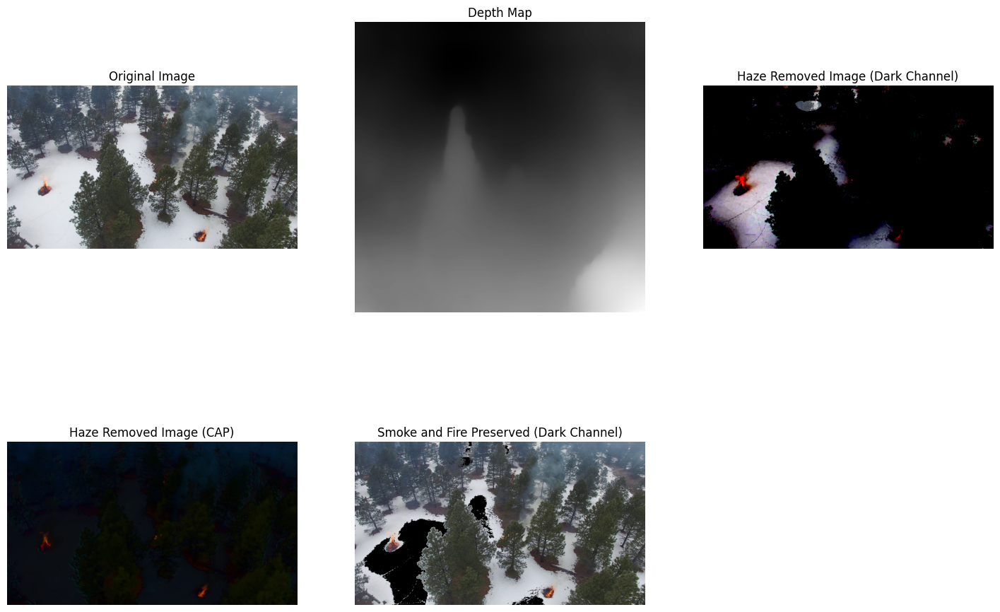

In [15]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_dark_channel(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

def remove_haze_CAP(image, atmospheric_light, omega=0.95):
    # Convert image to float32
    image_float = image.astype(np.float32) / 255.0
    
    # Expand atmospheric light to match the shape of the image
    atmospheric_light_expanded = np.expand_dims(np.expand_dims(atmospheric_light, axis=0), axis=0)
    
    # Estimate the transmission map using CAP
    transmission = 1 - omega * (np.min(image_float, axis=2, keepdims=True) / atmospheric_light_expanded)
    
    # Clip transmission values
    transmission = np.clip(transmission, 0, 1)
    
    # Recover the scene radiance
    scene_radiance = ((image_float - atmospheric_light_expanded) / transmission) + atmospheric_light_expanded
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 1)
    
    # Convert scene radiance back to uint8
    haze_removed_image_CAP = (scene_radiance * 255).astype(np.uint8)
    
    return haze_removed_image_CAP



def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_798.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Load the atmospheric light (manually set for demonstration)
atmospheric_light = np.array([210, 210, 210])

# Perform haze removal using dark channel prior
smoke_and_fire_image_dark_channel, haze_removed_image_dark_channel = remove_haze_dark_channel(image, depth_map, atmospheric_light)

# Perform haze removal using CAP
haze_removed_image_CAP = remove_haze_CAP(image, atmospheric_light)

# Display the original image, depth map, hazy image, haze-removed image (dark channel), and haze-removed image (CAP)
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Dark Channel)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image_CAP, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (CAP)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved (Dark Channel)')
plt.axis('off')

plt.show()


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


Loading weights:  None


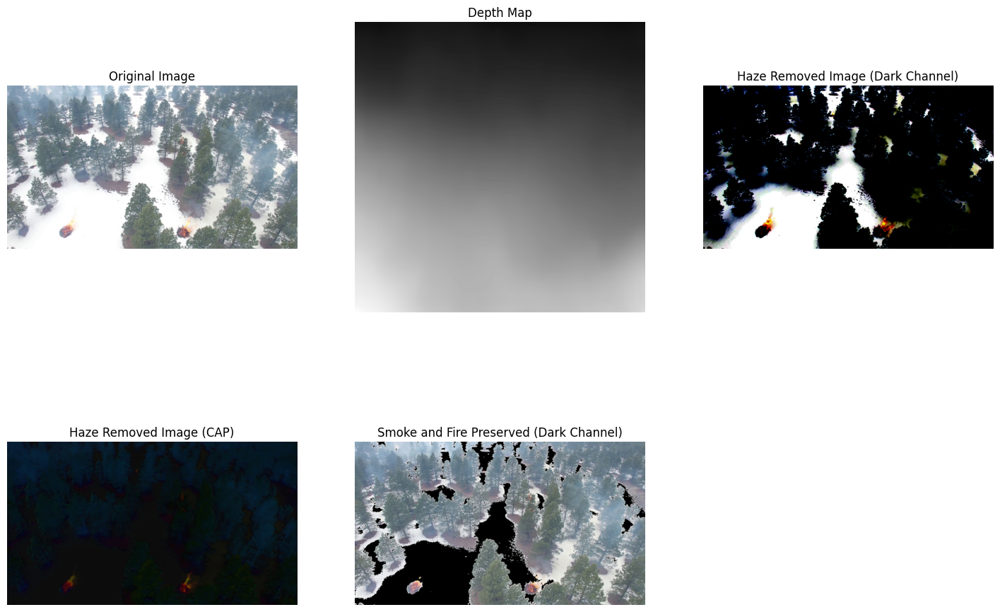

In [16]:
import cv2
import torch
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_dark_channel(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

def remove_haze_CAP(image, atmospheric_light, omega=0.95):
    # Convert image to float32
    image_float = image.astype(np.float32) / 255.0
    
    # Expand atmospheric light to match the shape of the image
    atmospheric_light_expanded = np.expand_dims(np.expand_dims(atmospheric_light, axis=0), axis=0)
    
    # Estimate the transmission map using CAP
    transmission = 1 - omega * (np.min(image_float, axis=2, keepdims=True) / atmospheric_light_expanded)
    
    # Clip transmission values
    transmission = np.clip(transmission, 0, 1)
    
    # Recover the scene radiance
    scene_radiance = ((image_float - atmospheric_light_expanded) / transmission) + atmospheric_light_expanded
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 1)
    
    # Convert scene radiance back to uint8
    haze_removed_image_CAP = (scene_radiance * 255).astype(np.uint8)
    
    return haze_removed_image_CAP



def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1931.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Load the atmospheric light (manually set for demonstration)
atmospheric_light = np.array([210, 210, 210])

# Perform haze removal using dark channel prior
smoke_and_fire_image_dark_channel, haze_removed_image_dark_channel = remove_haze_dark_channel(image, depth_map, atmospheric_light)

# Perform haze removal using CAP
haze_removed_image_CAP = remove_haze_CAP(image, atmospheric_light)

# Display the original image, depth map, hazy image, haze-removed image (dark channel), and haze-removed image (CAP)
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Dark Channel)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image_CAP, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (CAP)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved (Dark Channel)')
plt.axis('off')

plt.show()


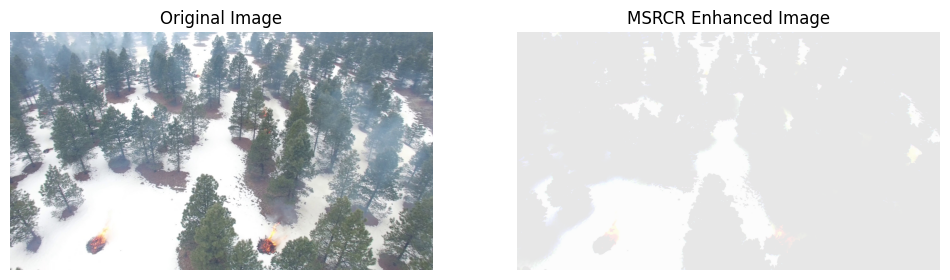

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def MSRCR(image, sigma_list=[15, 80, 250], G=5, b=25, alpha=125, beta=46, low_clip=0.01, high_clip=0.99):
    img = np.float64(image) + 1.0
    
    # Initialize multi-scale log intensity image
    intensity = np.zeros_like(img)
    
    # Compute log intensity for each scale
    for sigma in sigma_list:
        intensity += np.log(cv2.GaussianBlur(img, (G, G), sigma) + 1.0)
    intensity /= len(sigma_list)
    
    # Restore the color
    intensity = np.exp(intensity - np.mean(np.mean(intensity)))
    
    # Normalize intensity
    intensity = (intensity - intensity.min()) / (intensity.max() - intensity.min())
    
    # MSRCR enhancement
    retinex = np.exp((alpha * (intensity ** beta) - b) / 255.0)
    
    # Clip values to avoid saturation
    retinex = np.clip(retinex, low_clip, high_clip)
    
    # Scale retinex back to uint8 range
    retinex = (255 * retinex).astype(np.uint8)
    
    return retinex

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1931.jpg'
image = cv2.imread(image_path)

# Apply MSRCR enhancement
enhanced_image = MSRCR(image)

# Display the original and enhanced images
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
plt.title('MSRCR Enhanced Image')
plt.axis('off')

plt.show()


In [18]:
# Apply MSRCR enhancement to the hazy image
hazy_image_msrcr = MSRCR(hazy_image)

# Perform haze removal using CAP on the MSRCR enhanced hazy image
haze_removed_image_CAP_msrcr = remove_haze_CAP(hazy_image_msrcr, atmospheric_light)

# Display the original image, hazy image, MSRCR enhanced hazy image, and haze-removed image (CAP with MSRCR)
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(hazy_image, cv2.COLOR_BGR2RGB))
plt.title('Hazy Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(hazy_image_msrcr, cv2.COLOR_BGR2RGB))
plt.title('MSRCR Enhanced Hazy Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(haze_removed_image_CAP_msrcr, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (CAP with MSRCR)')
plt.axis('off')

plt.show()


NameError: name 'hazy_image' is not defined

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main
/tmp/ipykernel_34/1094604370.py:89: RuntimeWarning: divide by zero encountered in log
  retinex = np.log(image_float) - np.log(cv2.GaussianBlur(image_float, (0, 0), sigma))
/tmp/ipykernel_34/1094604370.py:90: RuntimeWarning: invalid value encountered in add
  image_float = restoration_factor * (image_float - retinex) + retinex
/tmp/ipykernel_34/1094604370.py:89: RuntimeWarning: invalid value encountered in log
  retinex = np.log(image_float) - np.log(cv2.GaussianBlur(image_float, (0, 0), sigma))
/tmp/ipykernel_34/1094604370.py:96: RuntimeWarning: invalid value encountered in cast
  haze_removed_image_MSRCR = enhanced_image.astype(np.uint8)


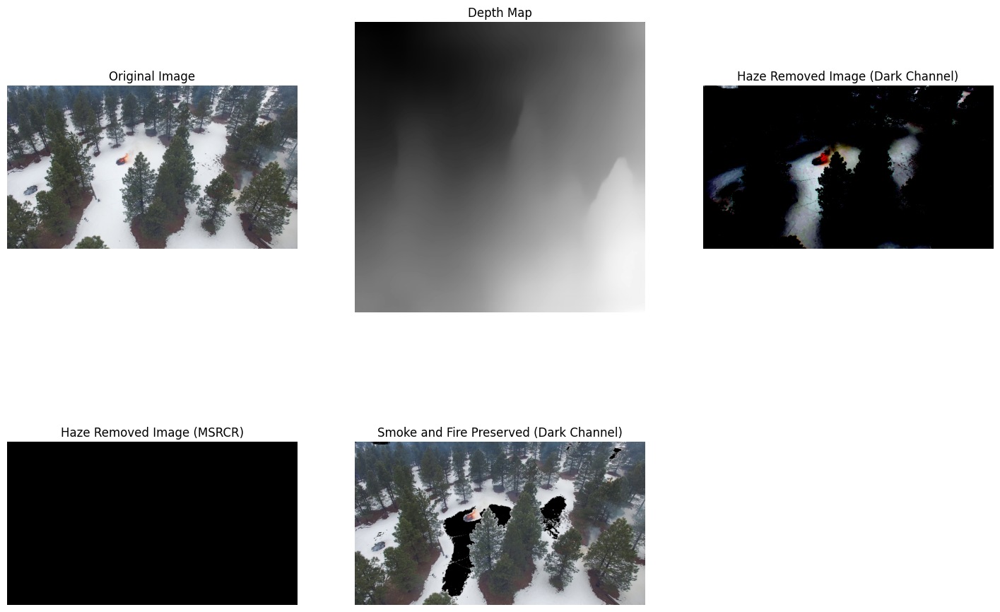

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze_dark_channel(image, depth_map, atmospheric_light, omega=0.95, t0=0.1, haze_threshold=100):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (image.shape[1], image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Estimate the dark channel prior
    dark_channel = estimate_dark_channel(image)
    
    # Calculate atmospheric light using the dark channel prior
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)
    
    # Apply haze removal to the image
    haze_removed_image = haze_removal(image, depth_map, atmospheric_light, omega, t0)
    
    # Convert image to grayscale
    gray_image = cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to keep only the smoke and fire parts
    smoke_and_fire_image = cv2.bitwise_and(image, image, mask=mask)
    
    return smoke_and_fire_image, haze_removed_image

def remove_haze_MSRCR(image, sigma_list=[15, 80, 250], gain=128, offset=128, restoration_factor=0.5):
    # Convert image to float32
    image_float = image.astype(np.float32) / 255.0
    
    # Apply Multi-Scale Retinex with Color Restoration (MSRCR)
    for sigma in sigma_list:
        retinex = np.log(image_float) - np.log(cv2.GaussianBlur(image_float, (0, 0), sigma))
        image_float = restoration_factor * (image_float - retinex) + retinex
    
    # Adjust gain and offset
    enhanced_image = np.clip(image_float * gain + offset, 0, 255)
    
    # Convert back to uint8
    haze_removed_image_MSRCR = enhanced_image.astype(np.uint8)
    
    return haze_removed_image_MSRCR

def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1021.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Load the atmospheric light (manually set for demonstration)
atmospheric_light = np.array([210, 210, 210])

# Perform haze removal using dark channel prior
smoke_and_fire_image_dark_channel, haze_removed_image_dark_channel = remove_haze_dark_channel(image, depth_map, atmospheric_light)

# Perform haze removal using MSRCR
haze_removed_image_MSRCR = remove_haze_MSRCR(image)

# Display the original image, depth map, hazy image, haze-removed image (dark channel), and haze-removed image (MSRCR)
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (Dark Channel)')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(haze_removed_image_MSRCR, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image (MSRCR)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(smoke_and_fire_image_dark_channel, cv2.COLOR_BGR2RGB))
plt.title('Smoke and Fire Preserved (Dark Channel)')
plt.axis('off')

plt.show()


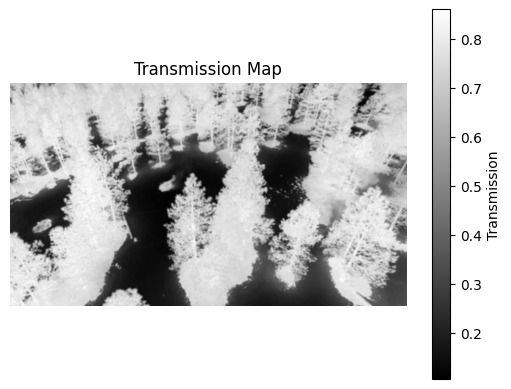

In [20]:
def visualize_transmission(transmission_map):
    plt.imshow(transmission_map, cmap='gray')
    plt.title('Transmission Map')
    plt.colorbar(label='Transmission')
    plt.axis('off')
    plt.show()

# Visualize the transmission map
visualize_transmission(transmission)


In [21]:
import cv2
import numpy as np

def calculate_metrics(image):
    # Calculate mean intensity
    mean_intensity = np.mean(image)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the histogram of the grayscale image
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    # Normalize the histogram to obtain the probability density function
    pdf = hist / np.sum(hist)

    # Calculate the mean intensity of the image using the probability density function
    mean_intensity_density = np.sum(np.arange(256) * pdf.flatten())

    # Calculate the variation in density of mean intensities
    variation_density_mean_intensities = np.sum(((np.arange(256) - mean_intensity_density) ** 2) * pdf.flatten())

    return mean_intensity, variation_density_mean_intensities

# Load the smoky image
smoky_image_path = '/kaggle/input/fire-data/Images/Images/image_10.jpg'
smoky_image = cv2.imread(smoky_image_path)

# Calculate metrics
mean_intensity, variation_density_mean_intensities = calculate_metrics(smoky_image)

print("Mean Intensity:", mean_intensity)
print("Variation in Density of Mean Intensities:", variation_density_mean_intensities)


Mean Intensity: 114.1275613265175
Variation in Density of Mean Intensities: 3582.189093343786


In [22]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def calculate_metrics(image):
    # Calculate mean intensity
    mean_intensity = np.mean(image)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the histogram of the grayscale image
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    # Normalize the histogram to obtain the probability density function
    pdf = hist / np.sum(hist)

    # Calculate the mean intensity of the image using the probability density function
    mean_intensity_density = np.sum(np.arange(256) * pdf.flatten())

    # Calculate the variation in density of mean intensities
    variation_density_mean_intensities = np.sum(((np.arange(256) - mean_intensity_density) ** 2) * pdf.flatten())

    return mean_intensity, variation_density_mean_intensities

# Load the smoky image
smoky_image_path = '/kaggle/input/fire-data/Images/Images/image_100.jpg'
smoky_image = cv2.imread(smoky_image_path)

# Calculate metrics
mean_intensity, variation_density_mean_intensities = calculate_metrics(smoky_image)

# Calculate SSIM and PSNR
hazy_image = cv2.imread(image_path)
ssim_value = ssim(smoky_image, hazy_image, multichannel=True)
psnr_value = psnr(smoky_image, hazy_image)

print("Mean Intensity:", mean_intensity)
print("Variation in Density of Mean Intensities:", variation_density_mean_intensities)
print("SSIM:", ssim_value)
print("PSNR:", psnr_value)


ValueError: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.

In [ ]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def calculate_metrics(image):
    # Calculate mean intensity
    mean_intensity = np.mean(image)

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Calculate the histogram of the grayscale image
    hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

    # Normalize the histogram to obtain the probability density function
    pdf = hist / np.sum(hist)

    # Calculate the 
    
    intensity of the image using the probability density function
    mean_intensity_density = np.sum(np.arange(256) * pdf.flatten())

    # Calculate the variation in density of mean intensities
    variation_density_mean_intensities = np.sum(((np.arange(256) - mean_intensity_density) ** 2) * pdf.flatten())

    return mean_intensity, variation_density_mean_intensities

# Load the smoky image
smoky_image_path = '/kaggle/input/fire-data/Images/Images/image_100.jpg'
smoky_image = cv2.imread(smoky_image_path)

# Calculate metrics
mean_intensity, variation_density_mean_intensities = calculate_metrics(smoky_image)

# Calculate SSIM and PSNR
hazy_image_path = '/kaggle/input/fire-data/Images/Images/image_10.jpg'
hazy_image = cv2.imread(hazy_image_path)

# Specify a smaller win_size parameter
ssim_value = ssim(smoky_image, hazy_image, win_size=3, multichannel=True)
psnr_value = psnr(smoky_image, hazy_image)

print("Mean Intensity:", mean_intensity)
print("Variation in Density of Mean Intensities:", variation_density_mean_intensities)
print("SSIM:", ssim_value)
print("PSNR:", psnr_value)


Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


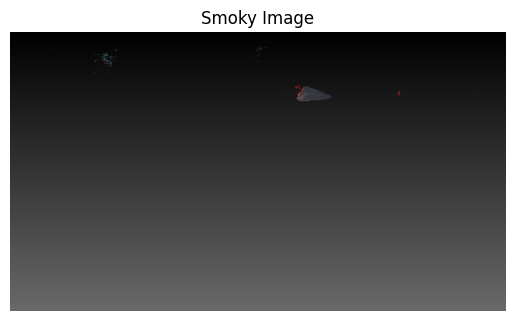

In [23]:
# import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

def estimate_dark_channel(image, patch_size=15):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Compute the dark channel
    dark_channel = cv2.erode(gray_image, np.ones((patch_size, patch_size), dtype=np.uint8))
    
    return dark_channel

def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_52.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Perform haze removal using depth map and atmospheric light
atmospheric_light = [210, 210, 210]  # Manually set atmospheric light for demonstration
haze_removed_image = haze_removal(image, depth_map, atmospheric_light)

# Estimate atmospheric light using the brightest pixel in the image
dark_channel = estimate_dark_channel(image)
atmospheric_light = estimate_atmospheric_light(image, dark_channel)

# Add smoke to the haze-removed image
smoky_image = add_smoke(haze_removed_image, smoke_intensity=0.7)

# Display the smoky image
plt.imshow(cv2.cvtColor(smoky_image, cv2.COLOR_BGR2RGB))
plt.title('Smoky Image')
plt.axis('off')
plt.show()


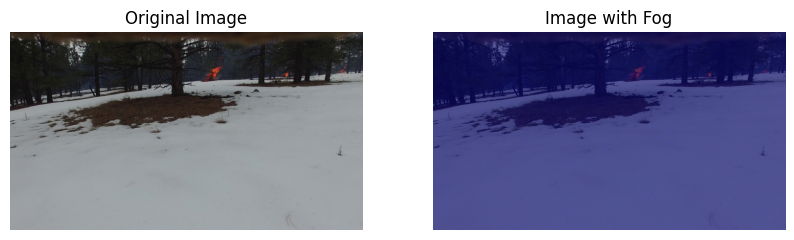

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_fog(image, fog_intensity=0.5):
    # Generate fog overlay
    fog_overlay = np.ones_like(image) * 255
    fog_overlay = fog_overlay.astype(np.uint8)
    fog_overlay = cv2.randu(fog_overlay, 0, 256)  # Add random noise to simulate fog
    
    # Blend original image and fog overlay
    foggy_image = cv2.addWeighted(image, 1 - fog_intensity, fog_overlay, fog_intensity, 0)
    foggy_image = np.clip(foggy_image, 0, 255).astype(np.uint8)
    
    return foggy_image

# Load the original image
original_image = cv2.imread(image_path)

# Add fog to the original image
foggy_image = add_fog(original_image)

# Display the original image and the image with fog
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(foggy_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Fog')
plt.axis('off')

plt.show()


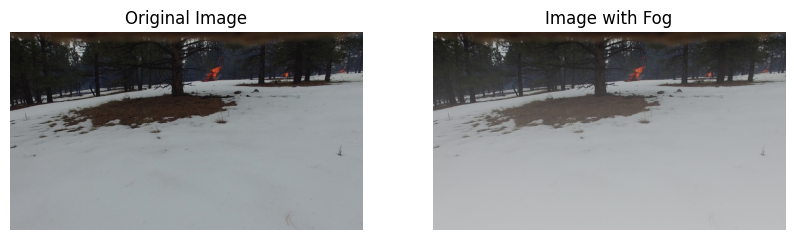

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_fog(image, fog_intensity=0.5):
    foggy_image = np.copy(image)
    
    # Define fog color (grayish)
    fog_color = (200, 200, 200)
    
    # Calculate fog intensity map based on image dimensions
    height, width, _ = image.shape
    fog_intensity_map = np.linspace(0, fog_intensity, height)
    
    # Apply fog to the image
    for y in range(height):
        alpha = fog_intensity_map[y]
        fog_layer = np.full((width, 3), fog_color, dtype=np.uint8)
        foggy_image[y] = cv2.addWeighted(image[y], 1 - alpha, fog_layer, alpha, 0)
    
    return foggy_image

# Load the original image
original_image = cv2.imread(image_path)

# Add fog to the original image
foggy_image = add_fog(original_image, fog_intensity=0.7)  # Adjust fog intensity as needed

# Display the original image and the image with fog
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(foggy_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Fog')
plt.axis('off')

plt.show()


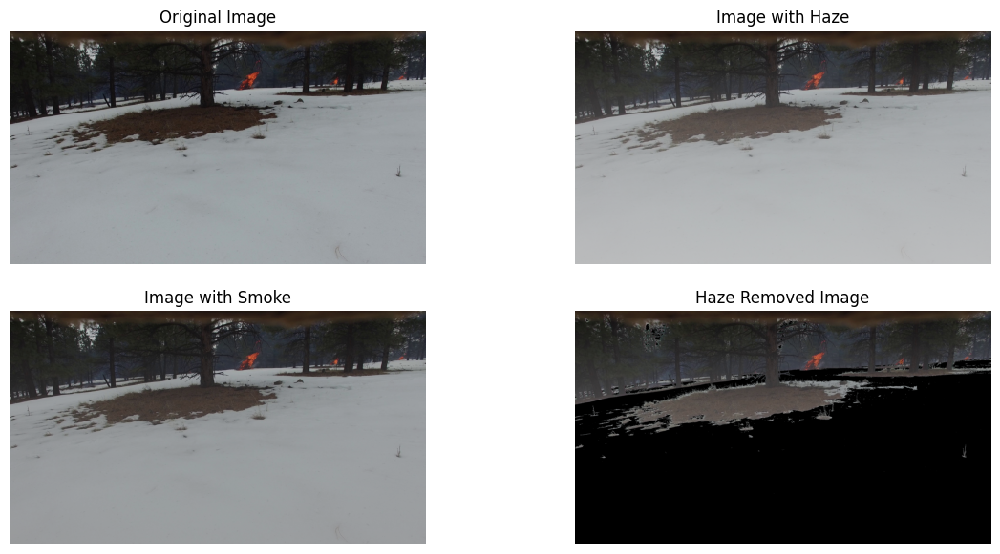

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_haze(image, haze_intensity=0.5):
    haze_image = np.copy(image)
    
    # Define haze color (grayish)
    haze_color = (200, 200, 200)
    
    # Calculate haze intensity map based on image dimensions
    height, width, _ = image.shape
    haze_intensity_map = np.linspace(0, haze_intensity, height)
    
    # Apply haze to the image
    for y in range(height):
        alpha = haze_intensity_map[y]
        haze_layer = np.full((width, 3), haze_color, dtype=np.uint8)
        haze_image[y] = cv2.addWeighted(image[y], 1 - alpha, haze_layer, alpha, 0)
    
    return haze_image

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (150, 150, 150)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        smoke_image[y] = cv2.addWeighted(image[y], 1 - alpha, smoke_layer, alpha, 0)
    
    return smoke_image

def remove_haze(image, haze_threshold=100):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Threshold the grayscale image to detect haze/fog regions
    _, mask = cv2.threshold(gray_image, haze_threshold, 255, cv2.THRESH_BINARY)
    
    # Invert the mask
    mask = cv2.bitwise_not(mask)
    
    # Apply the mask to the original image to remove haze/fog
    haze_removed_image = cv2.bitwise_and(image, image, mask=mask)
    
    return haze_removed_image

# Load the original image
original_image = cv2.imread(image_path)

# Add haze and smoke to the original image
haze_intensity = 0.7
smoke_intensity = 0.5
haze_image = add_haze(original_image, haze_intensity)
smoke_image = add_smoke(original_image, smoke_intensity)

# Remove haze from the haze image
haze_threshold = 150
haze_removed_image = remove_haze(haze_image, haze_threshold)

# Display the original image, haze image, smoke image, and haze removed image
plt.figure(figsize=(14, 7))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(haze_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Haze')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(smoke_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Smoke')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image')
plt.axis('off')

plt.show()


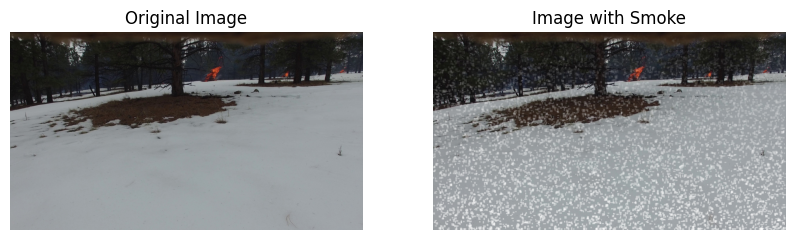

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_smoke(image, smoke_intensity=0.5):
    smoke_image = np.copy(image)
    
    # Define smoke color (translucent white)
    smoke_color = (255, 255, 255)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        # Generate random smoke patches
        num_patches = np.random.randint(3, 6)  # Randomly choose the number of patches for each row
        for _ in range(num_patches):
            # Randomly choose the position and size of each patch
            patch_width = np.random.randint(10, 30)
            patch_height = np.random.randint(10, 30)
            patch_x = np.random.randint(0, width - patch_width)
            patch_y = y + np.random.randint(-10, 10)
            # Ensure patch does not exceed image boundaries
            patch_x = max(0, min(width - patch_width, patch_x))
            patch_y = max(0, min(height - patch_height, patch_y))
            # Add the translucent smoke patch to the image
            smoke_patch = np.full((patch_height, patch_width, 3), smoke_color, dtype=np.uint8)
            smoke_image[patch_y:patch_y+patch_height, patch_x:patch_x+patch_width] = cv2.addWeighted(
                smoke_image[patch_y:patch_y+patch_height, patch_x:patch_x+patch_width], 1 - alpha,
                smoke_patch, alpha, 0)
    
    return smoke_image

# Load the original image
original_image = cv2.imread(image_path)

# Add smoke to the original image
smoke_intensity = 0.5  # Adjust smoke intensity as needed
smoke_image = add_smoke(original_image, smoke_intensity)

# Display the original image and the image with smoke
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(smoke_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Smoke')
plt.axis('off')

plt.show()


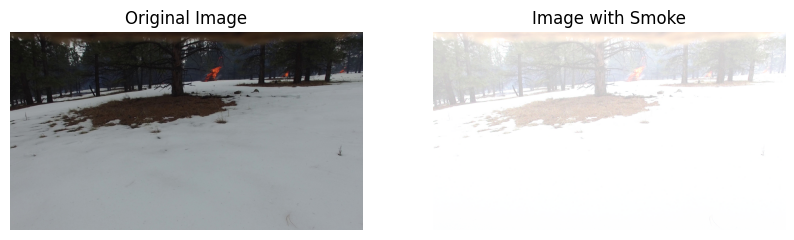

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def add_smoke(image, smoke_intensity=0.3):
    smoke_image = np.copy(image)
    
    # Define smoke color (grayish)
    smoke_color = (200, 200, 200)
    
    # Calculate smoke intensity map based on image dimensions
    height, width, _ = image.shape
    smoke_intensity_map = np.linspace(0, smoke_intensity, height)
    
    # Generate a noise texture for smoke
    noise_texture = np.random.randint(0, 256, size=(height, width, 3)).astype(np.uint8)
    
    # Apply smoke to the image
    for y in range(height):
        alpha = smoke_intensity_map[y]
        smoke_layer = np.full((width, 3), smoke_color, dtype=np.uint8)
        # Add noise to the smoke layer
        smoke_layer_with_noise = cv2.addWeighted(smoke_layer, 1 - alpha, noise_texture[y], alpha, 0)
        smoke_image[y] = cv2.addWeighted(image[y], 1, smoke_layer_with_noise, 1, 0)
    
    return smoke_image

# Load the original image
original_image = cv2.imread(image_path)

# Add smoke to the original image
smoke_intensity = 0.6  # Adjust smoke intensity as needed
smoke_image = add_smoke(original_image, smoke_intensity)

# Display the original image and the image with smoke
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(smoke_image, cv2.COLOR_BGR2RGB))
plt.title('Image with Smoke')
plt.axis('off')

plt.show()


(-0.5, 3839.5, 2159.5, -0.5)

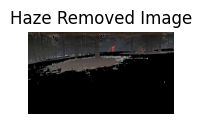

In [29]:
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image')
plt.axis('off')

Using cache found in /root/.cache/torch/hub/intel-isl_MiDaS_master


Loading weights:  None


Using cache found in /root/.cache/torch/hub/facebookresearch_WSL-Images_main


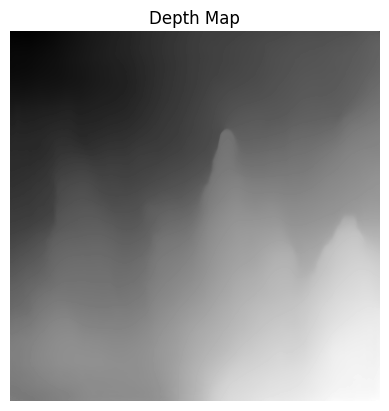

In [30]:
import cv2
import torch
import torchvision.transforms as transforms
from torchvision.models import mobilenet_v2
from torchvision.models._utils import IntermediateLayerGetter
from torch.hub import load_state_dict_from_url
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/kaggle/input/fire-data/Images/Images/image_1074.jpg'
image = cv2.imread(image_path)

# Resize the image to a compatible size
resized_image = cv2.resize(image, (384, 384))  # Resize to (H, W)

# Preprocess the image for the MiDaS model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_image = transform(resized_image)

# Load the MiDaS model
midas = torch.hub.load("intel-isl/MiDaS", "MiDaS")
midas.eval()

# Estimate depth map
with torch.no_grad():
    prediction = midas(input_image.unsqueeze(0))

# Post-process the depth map
depth_map = prediction.squeeze().cpu().numpy()

# Normalize depth map to [0, 255]
depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map)) * 255
depth_map = depth_map.astype(np.uint8)

# Save the depth map as an image file
cv2.imwrite('/kaggle/working/depth_map.jpg', depth_map)

# Display the depth map using matplotlib
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')
plt.show()


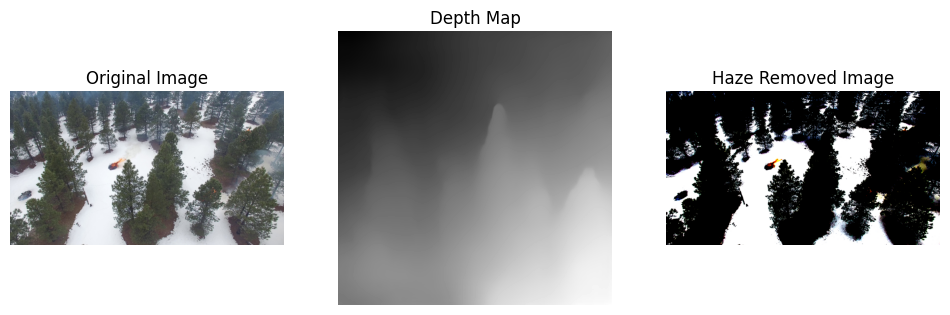

In [31]:
def haze_removal(original_image, depth_map, atmospheric_light, omega=0.95, t0=0.1):
    # Resize the depth map to match the dimensions of the original image
    resized_depth_map = cv2.resize(depth_map, (original_image.shape[1], original_image.shape[0]))
    
    # Compute the transmission map using depth-based haze model
    transmission = 1 - omega * resized_depth_map
    
    # Clip transmission values
    transmission = np.clip(transmission, t0, 1)
    
    # Recover the scene radiance
    scene_radiance = np.zeros_like(original_image, dtype=np.float32)
    for channel in range(3):
        scene_radiance[:, :, channel] = ((original_image[:, :, channel].astype(np.float32) - atmospheric_light[channel]) / 
                                         transmission + atmospheric_light[channel])
    
    # Clip the radiance values
    scene_radiance = np.clip(scene_radiance, 0, 255).astype(np.uint8)
    
    return scene_radiance

# Estimate atmospheric light using the brightest pixel in the image
def estimate_atmospheric_light(image, dark_channel, percentile=0.001):
    m = max(int(percentile * dark_channel.size), 1)
    flat_dark = dark_channel.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    atmospheric_light = np.max(image.reshape(-1, 3)[indices], axis=0)
    return atmospheric_light

# Load the original image
original_image = cv2.imread(image_path)

# Perform haze removal using depth map and atmospheric light
haze_removed_image = haze_removal(original_image, depth_map, atmospheric_light)

# Display the original image, depth map, and haze removed image
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(depth_map, cmap='gray')
plt.title('Depth Map')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))
plt.title('Haze Removed Image')
plt.axis('off')

plt.show()


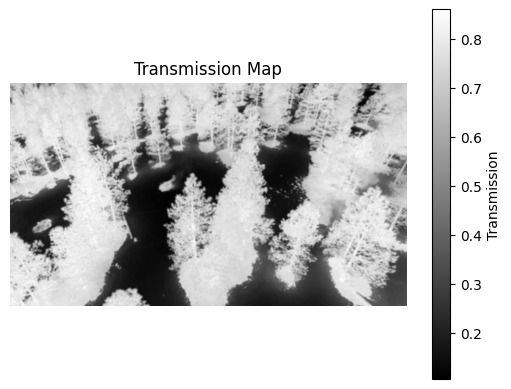

In [32]:
def visualize_transmission(transmission_map):
    plt.imshow(transmission_map, cmap='gray')
    plt.title('Transmission Map')
    plt.colorbar(label='Transmission')
    plt.axis('off')
    plt.show()

# Visualize the transmission map
visualize_transmission(transmission)


In [33]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# Calculate PSNR
psnr_value = psnr(original_image, haze_removed_image)

# Calculate SSIM with automatic window size calculation
ssim_value, _ = ssim(original_image, haze_removed_image, multichannel=True)



print(f"PSNR: {psnr_value:.2f}")
print(f"SSIM: {ssim_value:.4f}")


ValueError: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.

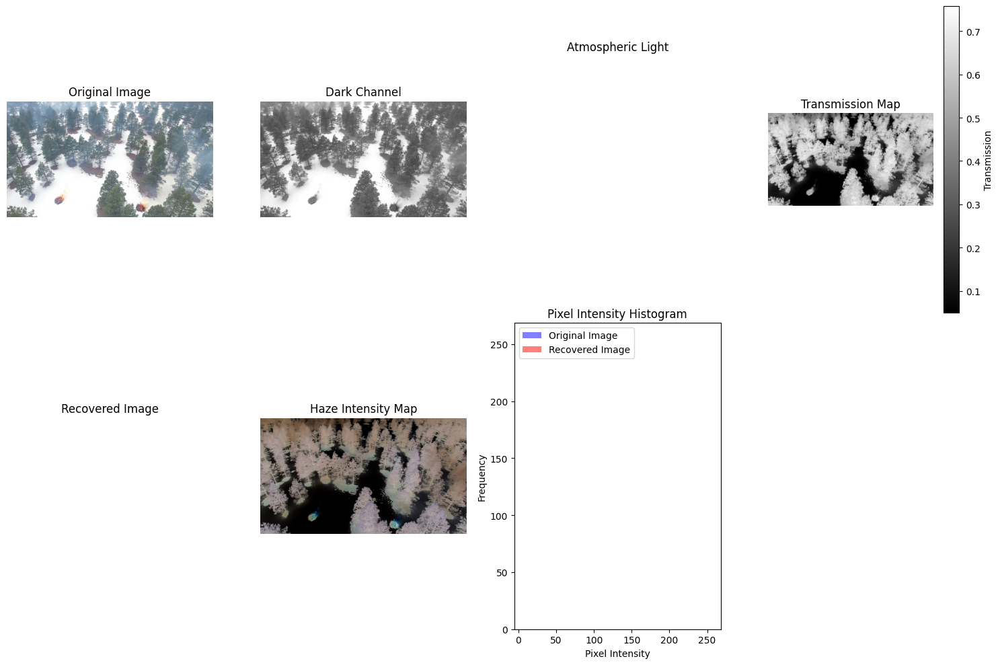

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1935.jpg'
image = cv2.imread(im_path)

# Compute dark channel
dark = dark_channel(image, 15)

# Estimate atmospheric light
atmospheric_light = estimate_atmospheric_light(image, dark)

# Estimate transmission map
transmission = estimate_transmission(atmospheric_light, image, 15)

# Recover scene radiance
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Visualizations
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Dark Channel
plt.subplot(2, 4, 2)
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')

# Atmospheric Light
plt.subplot(2, 4, 3)
plt.imshow(np.tile(atmospheric_light, (100, 100, 1)).astype(np.uint8))
plt.title('Atmospheric Light')
plt.axis('off')

# Transmission Map
plt.subplot(2, 4, 4)
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.colorbar(label='Transmission')
plt.axis('off')

# Recovered Image
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')

# Haze Intensity Map
haze_intensity_map = np.abs(image.astype(np.float32) - scene_radiance.astype(np.float32))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')

# Histogram Analysis
plt.subplot(2, 4, 7)
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.5, label='Original Image', density=True)
plt.hist(scene_radiance.ravel(), bins=256, color='red', alpha=0.5, label='Recovered Image', density=True)
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


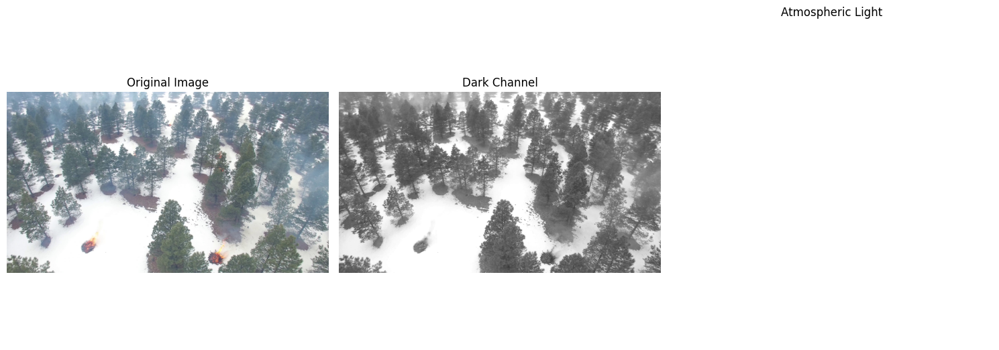

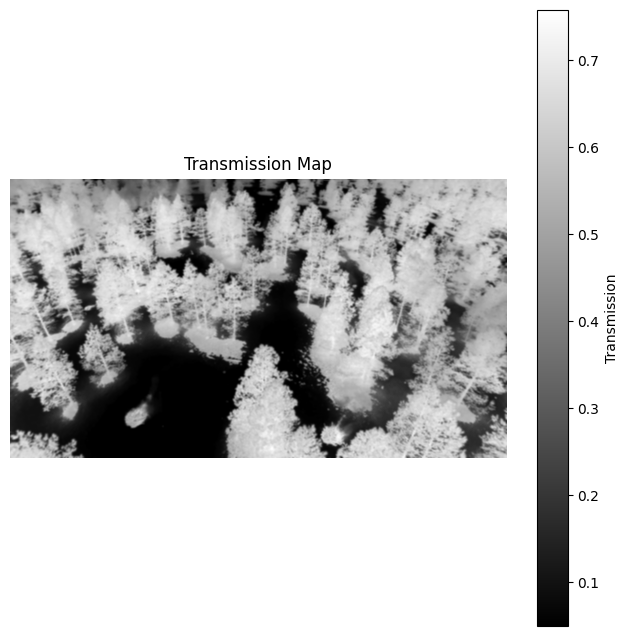

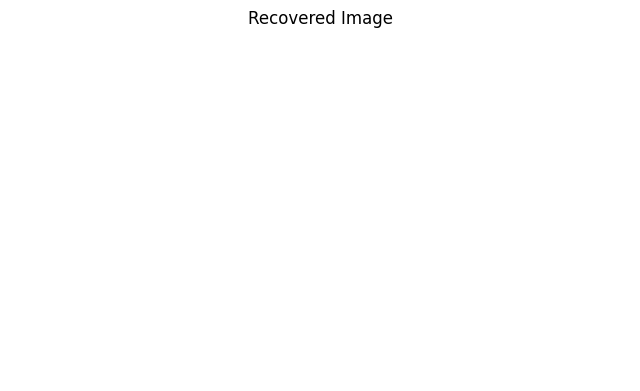

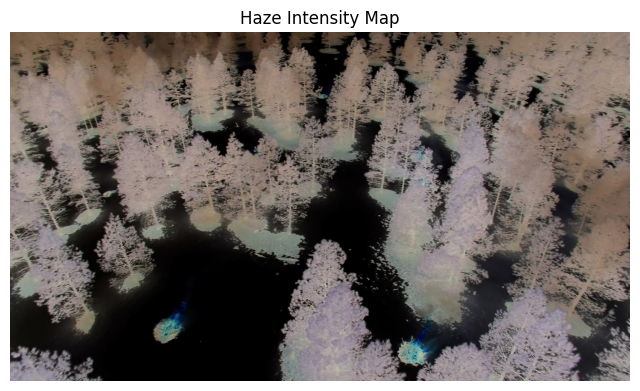

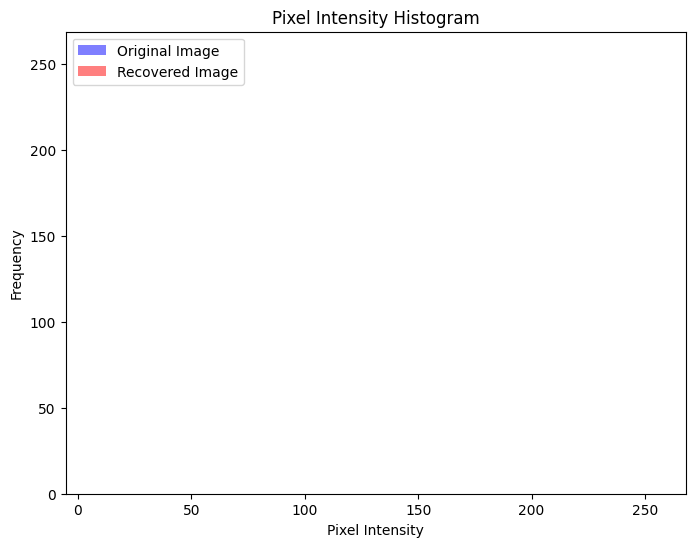

In [38]:
# Visualizations
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Dark Channel
plt.subplot(1, 3, 2)
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')

# Atmospheric Light
plt.subplot(1, 3, 3)
plt.imshow(np.tile(atmospheric_light, (100, 100, 1)).astype(np.uint8))
plt.title('Atmospheric Light')
plt.axis('off')

plt.tight_layout()
plt.show()

# Transmission Map
plt.figure(figsize=(8, 8))
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.colorbar(label='Transmission')
plt.axis('off')
plt.show()

# Recovered Image
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')
plt.show()

# Haze Intensity Map
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')
plt.show()

# Histogram Analysis
plt.figure(figsize=(8, 6))
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.5, label='Original Image', density=True)
plt.hist(scene_radiance.ravel(), bins=256, color='red', alpha=0.5, label='Recovered Image', density=True)
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.show()


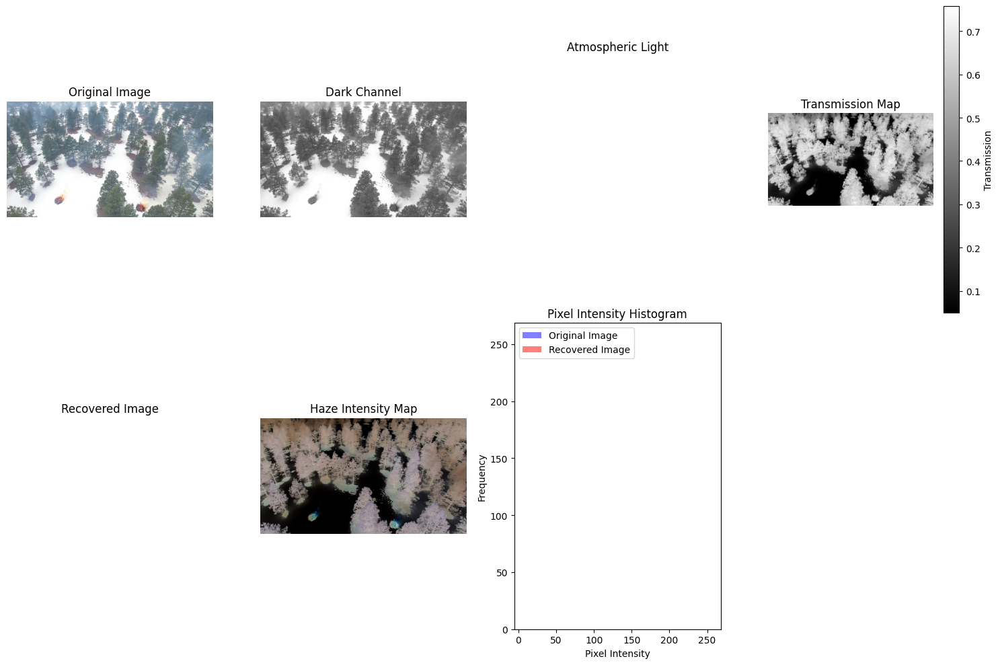

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1935.jpg'
image = cv2.imread(im_path)

# Compute dark channel
dark = dark_channel(image, 15)

# Estimate atmospheric light
atmospheric_light = estimate_atmospheric_light(image, dark)

# Estimate transmission map
transmission = estimate_transmission(atmospheric_light, image, 15)

# Recover scene radiance
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Visualizations
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Dark Channel
plt.subplot(2, 4, 2)
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')

# Atmospheric Light
plt.subplot(2, 4, 3)
plt.imshow(np.tile(atmospheric_light, (100, 100, 1)).astype(np.uint8))
plt.title('Atmospheric Light')
plt.axis('off')

# Transmission Map
plt.subplot(2, 4, 4)
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.colorbar(label='Transmission')
plt.axis('off')

# Recovered Image
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')

# Haze Intensity Map
haze_intensity_map = np.abs(image.astype(np.float32) - scene_radiance.astype(np.float32))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')

# Histogram Analysis
plt.subplot(2, 4, 7)
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.5, label='Original Image', density=True)
plt.hist(scene_radiance.ravel(), bins=256, color='red', alpha=0.5, label='Recovered Image', density=True)
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


In [40]:
# Define a function to compute PSNR and SSIM
def compute_metrics(original_image, recovered_image):
    psnr_value = PSNR(original_image, recovered_image)
    ssim_value = SSIM(original_image, recovered_image, win_size=11, multichannel=True)  # Specify win_size
    return psnr_value, ssim_value


# Define a function to generate error map
def generate_error_map(original_image, recovered_image):
    error_map = np.abs(original_image.astype(np.float32) - recovered_image.astype(np.float32))
    return error_map

# Define a function to visualize PSNR and SSIM over parameter variations
def visualize_metrics_over_parameter_variations(parameter_range, metrics):
    plt.figure(figsize=(10, 6))
    plt.plot(parameter_range, metrics[:, 0], label='PSNR', marker='o')
    plt.plot(parameter_range, metrics[:, 1], label='SSIM', marker='o')
    plt.xlabel('Parameter Value')
    plt.ylabel('Metric Value')
    plt.title('PSNR and SSIM over Parameter Variations')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define parameter range
parameter_range = np.arange(0.1, 1.1, 0.1)

# Compute PSNR and SSIM for each parameter value
psnr_ssim_metrics = []
for param in parameter_range:
    # Estimate transmission map with current parameter value
    transmission_map = estimate_transmission(atmospheric_light, image, 15, omega=param)
    # Recover scene radiance with current transmission map
    recovered_image = recover_scene_radiance(atmospheric_light, image, transmission_map)
    # Compute PSNR and SSIM
    psnr, ssim = compute_metrics(image, recovered_image)
    psnr_ssim_metrics.append([psnr, ssim])

# Convert list to numpy array
psnr_ssim_metrics = np.array(psnr_ssim_metrics)

# Visualize PSNR and SSIM over parameter variations
visualize_metrics_over_parameter_variations(parameter_range, psnr_ssim_metrics)


NameError: name 'PSNR' is not defined

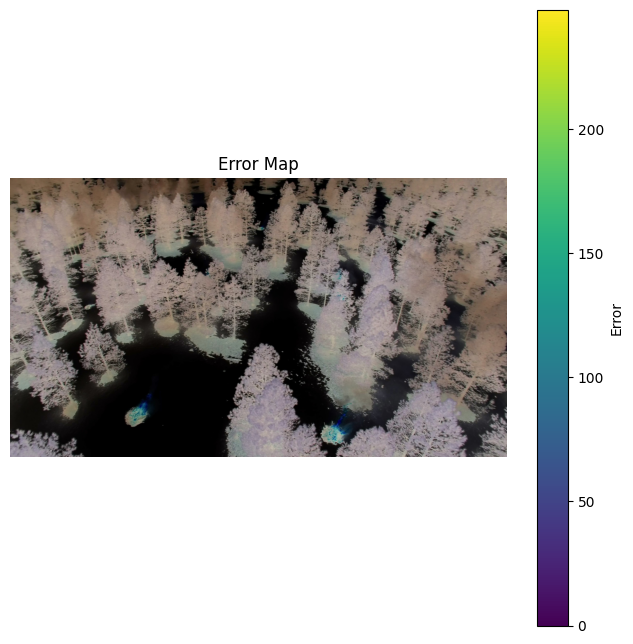

In [41]:
# Generate error map
error_map = generate_error_map(image, recovered_image)

# Visualize error map
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(error_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Error Map')
plt.axis('off')
plt.colorbar(label='Error')
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1143.jpg'
image = cv2.imread(im_path)

# Compute dark channel
dark = dark_channel(image, 15)

# Estimate atmospheric light
atmospheric_light = estimate_atmospheric_light(image, dark)

# Estimate transmission map
transmission = estimate_transmission(atmospheric_light, image, 15)

# Recover scene radiance
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Visualizations
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Dark Channel
plt.subplot(2, 4, 2)
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')

# Atmospheric Light
plt.subplot(2, 4, 3)
plt.imshow(np.tile(atmospheric_light, (100, 100, 1)).astype(np.uint8))
plt.title('Atmospheric Light')
plt.axis('off')

# Transmission Map
plt.subplot(2, 4, 4)
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.colorbar(label='Transmission')
plt.axis('off')

# Recovered Image
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')

# Haze Intensity Map
haze_intensity_map = np.abs(image.astype(np.float32) - scene_radiance.astype(np.float32))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')

# Histogram Analysis
plt.subplot(2, 4, 7)
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.5, label='Original Image', density=True)
plt.hist(scene_radiance.ravel(), bins=256, color='red', alpha=0.5, label='Recovered Image', density=True)
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(im, size):
    """Calculate the Dark Channel for an image."""
    return cv2.min(cv2.min(im[:,:,0], im[:,:,1]), im[:,:,2])

def estimate_atmospheric_light(im, dark):
    """Estimate the atmospheric light in the image."""
    # Using the top 0.1% brightest pixels in the dark channel
    m = max(int(0.001 * dark.size), 1)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -m)[-m:]
    return np.max(im.reshape(-1, 3)[indices], axis=0)

def estimate_transmission(atmospheric_light, im, size, omega=0.95):
    """Estimate the transmission map."""
    normalized_im = im / atmospheric_light
    raw_transmission = 1 - omega * dark_channel(normalized_im, size)
    return cv2.blur(raw_transmission, (size, size))

def recover_scene_radiance(atmospheric_light, im, transmission, t0=0.1):
    """Recover the scene radiance from the transmission map."""
    transmission = np.clip(transmission, t0, 1)
    transmission = np.expand_dims(transmission, axis=2)  # Expand dimensions to match im
    radiance = (im - atmospheric_light) / transmission + atmospheric_light
    return np.clip(radiance, 0, 255).astype(np.uint8)

# Load the image
im_path = '/kaggle/input/fire-data/Images/Images/image_1204.jpg'
image = cv2.imread(im_path)

# Compute dark channel
dark = dark_channel(image, 15)

# Estimate atmospheric light
atmospheric_light = estimate_atmospheric_light(image, dark)

# Estimate transmission map
transmission = estimate_transmission(atmospheric_light, image, 15)

# Recover scene radiance
scene_radiance = recover_scene_radiance(atmospheric_light, image, transmission)

# Visualizations
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 4, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Dark Channel
plt.subplot(2, 4, 2)
plt.imshow(dark, cmap='gray')
plt.title('Dark Channel')
plt.axis('off')

# Atmospheric Light
plt.subplot(2, 4, 3)
plt.imshow(np.tile(atmospheric_light, (100, 100, 1)).astype(np.uint8))
plt.title('Atmospheric Light')
plt.axis('off')

# Transmission Map
plt.subplot(2, 4, 4)
plt.imshow(transmission, cmap='gray')
plt.title('Transmission Map')
plt.colorbar(label='Transmission')
plt.axis('off')

# Recovered Image
plt.subplot(2, 4, 5)
plt.imshow(cv2.cvtColor(scene_radiance, cv2.COLOR_BGR2RGB))
plt.title('Recovered Image')
plt.axis('off')

# Haze Intensity Map
haze_intensity_map = np.abs(image.astype(np.float32) - scene_radiance.astype(np.float32))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')

# Histogram Analysis
plt.subplot(2, 4, 7)
plt.hist(image.ravel(), bins=256, color='blue', alpha=0.5, label='Original Image', density=True)
plt.hist(scene_radiance.ravel(), bins=256, color='red', alpha=0.5, label='Recovered Image', density=True)
plt.title('Pixel Intensity Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Generate error map
error_map = generate_error_map(image, recovered_image)

# Visualize error map
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(error_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Error Map')
plt.axis('off')
plt.colorbar(label='Error')
plt.show()


In [ ]:
# Define a function to compute PSNR and SSIM
def compute_metrics(original_image, recovered_image):
    psnr_value = PSNR(original_image, recovered_image)
    ssim_value = SSIM(original_image, recovered_image, multichannel=True)
    return psnr_value, ssim_value

# Define a function to perform parameter sensitivity analysis
def parameter_sensitivity_analysis(parameter_range, parameter_name='Omega'):
    psnr_values = []
    ssim_values = []
    
    for param in parameter_range:
        # Estimate transmission map with current parameter value
        transmission_map = estimate_transmission(atmospheric_light, image, 15, omega=param)
        # Recover scene radiance with current transmission map
        recovered_image = recover_scene_radiance(atmospheric_light, image, transmission_map)
        # Compute PSNR and SSIM
        psnr, ssim = compute_metrics(image, recovered_image)
        psnr_values.append(psnr)
        ssim_values.append(ssim)
    
    # Plot PSNR and SSIM values over parameter range
    plt.figure(figsize=(10, 6))
    plt.plot(parameter_range, psnr_values, label='PSNR', marker='o')
    plt.plot(parameter_range, ssim_values, label='SSIM', marker='o')
    plt.xlabel(parameter_name)
    plt.ylabel('Metric Value')
    plt.title('Parameter Sensitivity Analysis')
    plt.legend()
    plt.grid(True)
    plt.show()

# Define parameter range
omega_range = np.arange(0.1, 1.1, 0.1)

# Perform parameter sensitivity analysis for omega
parameter_sensitivity_analysis(omega_range, parameter_name='Omega')


In [ ]:
# Haze Intensity Map
haze_intensity_map = np.abs(image.astype(np.float32) - scene_radiance.astype(np.float32))
plt.subplot(2, 4, 6)
plt.imshow(cv2.cvtColor(haze_intensity_map.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title('Haze Intensity Map')
plt.axis('off')

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# Calculate PSNR
psnr = peak_signal_noise_ratio(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB), cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB))

# Calculate SSIM with a smaller window size
ssim = structural_similarity(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB), 
                             cv2.cvtColor(haze_removed_image, cv2.COLOR_BGR2RGB),
                             win_size=5, multichannel=True)


print(f'PSNR: {psnr:.2f}')
print(f'SSIM: {ssim:.2f}')


In [ ]:
from skimage import metrics

def calculate_metrics(original_image, haze_removed_image):
    # Convert images to float32 for metric calculation
    original_image_float = original_image.astype(np.float32) / 255.0
    haze_removed_image_float = haze_removed_image.astype(np.float32) / 255.0
    
    # Calculate PSNR
    psnr = metrics.peak_signal_noise_ratio(original_image_float, haze_removed_image_float)
    
    # Calculate SSIM
    ssim = metrics.structural_similarity(original_image_float, haze_removed_image_float, multichannel=True)
    
    return psnr, ssim

# Calculate metrics
psnr, ssim = calculate_metrics(original_image, haze_removed_image)

print("PSNR:", psnr)
print("SSIM:", ssim)


In [ ]:
from skimage.metrics import peak_signal_noise_ratio as PSNR
from skimage.metrics import structural_similarity as SSIM

# Calculate PSNR and SSIM between original and haze-removed images
psnr_value = PSNR(original_image, haze_removed_image)
ssim_value = SSIM(original_image, haze_removed_image, multichannel=True)

print(f"PSNR: {psnr_value:.2f} dB")
print(f"SSIM: {ssim_value:.2f}")


In [ ]:
pip install scikit-image
